In [1]:
import tensorflow as tf
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

In [2]:
import keras
import pandas as pd
import tensorflow as tf

import numpy as np
# from keras.models import Sequential, Model
# from keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D
from keras.utils import np_utils

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D, Input,AveragePooling2D, BatchNormalization, LeakyReLU, SpatialDropout2D

# from keras.applications import MobileNet
# from keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2, InceptionV3
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import os
from sklearn.model_selection import train_test_split

import seaborn as sns
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.model_selection import KFold

from collections import defaultdict,Counter
from imblearn.over_sampling import SMOTE
from PIL import Image

from kerastuner import HyperModel

Using TensorFlow backend.


<h2>Data Loading and Preparation</h2>

In [3]:
def getSpeciesCode(x):
    part = x.split('_')
    if part[0] == 'ASETRI':
        return 0
    elif part[0] == 'EPTBOT':
        return 1
    elif part[0] == 'MYOEMA':
        return 2
    elif part[0] == 'PIPKUH':
        return 3
    elif part[0] == 'RHIMUS':
        return 4
    elif part[0] == 'RHYNAS':
        return 5
    elif part[0] == 'ROUAEG':
        return 6
    elif part[0] == 'TAPPER':
        return 7
    else:
        return 'Unknown'
    
def getSpecies(x):
    if x == 0:
        return 'A.tridens'
    elif x == 1:
        return 'E.bottae'
    elif x == 2:
        return 'M.emarginatus'
    elif x == 3:
        return 'P.kuhli'
    elif x == 4:
        return 'R.muscatellum'
    elif x == 5:
        return 'R.nasutus'
    elif x == 6:
        return 'R.aegyptius'
    elif x == 7:
        return 'T.perforatus'
    else:
        return 'Unknown'
    
    
def generate_actual_predicted(Y_pred, X_test, Y_test): 
    predicted = list()
    for i in range(len(Y_pred)):
        predicted.append(np.argmax(Y_pred[i]))
        
    actual = list()
    for i in range(len(Y_test)):
        actual.append(np.argmax(Y_test[i]))
        
    return actual, predicted



# Ytrain in Onehot encoded form 
def makeOverSamplesSMOTE(X_train,Y_train):
    
    Y_train_labelled=[]
    X_dims=X_train.shape

    for i in range(len(Y_train)):
        Y_train_labelled.append(np.argmax(Y_train[i]))

    print('Original trainingset shape %s' %  [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])       
    X_train= X_train.reshape(-1,X_dims[1]*X_dims[2]*X_dims[3])

    sm = SMOTE(sampling_strategy='all',k_neighbors=5)
    X_train, Y_train_labelled = sm.fit_resample(X_train, Y_train_labelled)


    print('Resampled training set shape %s' % [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])


    #reshape X_all
    X_train= X_train.reshape(-1,X_dims[1],X_dims[2],X_dims[3])

    # update Y_train
    Y_train= np_utils.to_categorical(Y_train_labelled, num_classes=8)

    print("After OverSampling\nX_train: shape= ",X_train.shape)
    print("Y_train: shape= ",Y_train.shape)

    
    
    return(X_train,Y_train)

In [4]:
image_folder_path = '../../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]
species = []
for file_name in file_paths:
    sp = file_name.split('_')
    species.append(sp[0])

df = pd.DataFrame(species, columns=['Species'])
df['Species'].value_counts()

RHIMUS    1665
TAPPER     403
PIPKUH     299
RHYNAS     269
EPTBOT     124
ROUAEG     121
MYOEMA     112
ASETRI      25
Name: Species, dtype: int64

In [5]:
X_all = []
Y_all = []

image_folder_path = '../../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((170, 112))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [6]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 112, 170, 3)
(3018,)


In [7]:
# train /test= 80/20% split
# Data is stratified
X_train, X_test, Y_train, Y_test = train_test_split(X_all, Y_all, test_size=0.2, random_state = 245, stratify=Y_all)


<h2> V1 !!!!! K-Fold Training and Evaluation</h2>

In [8]:
folder = "models"
mode_version = "spec_smote_v1"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v1


In [11]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=16,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=64,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=112,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(80)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(96)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(32)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [12]:
model = build_current_model()
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 56, 85, 16)        2368      
_________________________________________________________________
batch_normalization_7 (Batch (None, 56, 85, 16)        64        
_________________________________________________________________
activation_7 (Activation)    (None, 56, 85, 16)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 28, 43, 16)        0         
_________________________________________________________________
spatial_dropout2d_4 (Spatial (None, 28, 43, 16)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 14, 22, 64)        2566

In [13]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 6s - loss: 1.7256 - accuracy: 0.3479 - val_loss: 1.4538 - val_accuracy: 0.5000
Epoch 2/100
1199/1199 - 5s - loss: 1.2218 - accuracy: 0.5740 - val_loss: 1.8311 - val_accuracy: 0.3382
Epoch 3/100
1199/1199 - 6s - loss: 0.8200 - accuracy: 0.7281 - val_loss: 1.0742 - val_accuracy: 0.6305
Epoch 4/100
1199/1199 - 6s - loss: 0.6349 - accuracy: 0.7897 - val_loss: 0.8628 - val_accuracy: 0.6801
Epoch 5/100
1199/1199 - 5s - loss: 0.5384 - accuracy: 0.8229 - val_loss: 0.5417 - val_accuracy: 0.8180

Epoch 16/100
1199/1199 - 5s - loss: 0.2166 - accuracy: 0.9308 - val_loss: 0.4241 - val_accuracy: 0.8585
Epoch 17/100
1199/1199 - 4s - loss: 0.2138 - accuracy: 0.9318 - val_loss: 0.2529 - val_accuracy: 0.9338
Epoch 18/100
1199/1199 - 6s - loss: 0.2023 - accuracy: 0.9346 - val_loss: 0.2901 - val_accuracy: 0.9154
Epoch 19/100
1199/1199 - 6s - loss: 0.1878 - accuracy: 0.9425 - val_loss: 0.2795 - val_accuracy: 0.9265
Epoch 20/100
1199/1199 - 6s - loss: 0.1917 - accuracy: 0.9401 - val_loss: 0.7289 - val_accuracy: 0.7831
Epoch 21/100
1199/1199 - 5s - loss: 0.1885 - accuracy: 0.9427 - val_loss: 0.2974 - val_accuracy: 0.9118
Epoch 22/100
1199/1199 - 5s - loss: 0.1726 - accuracy: 0.9462 - val_loss: 0.4804 - val_accuracy: 0.8676
Epoch 23/100
1199/1199 - 5s - loss: 0.1752 - accuracy: 0.9487 - val_loss: 0.3098 - val_accuracy: 0.9081
Epoch 24/100
1199/1199 - 5s - loss: 0.1439 - accuracy: 0.9570 - val_loss: 0.3462 - val_accuracy: 0.8879
Epoch 25/100
1199/1199 - 5s - loss: 0.1501 - accuracy: 0.9531 - 

Epoch 32/100
1198/1198 - 6s - loss: 0.1355 - accuracy: 0.9564 - val_loss: 0.3212 - val_accuracy: 0.9154
Epoch 33/100
1198/1198 - 5s - loss: 0.1372 - accuracy: 0.9547 - val_loss: 0.2840 - val_accuracy: 0.9191
Epoch 34/100
1198/1198 - 5s - loss: 0.1345 - accuracy: 0.9590 - val_loss: 0.2255 - val_accuracy: 0.9393
Epoch 35/100
1198/1198 - 5s - loss: 0.1232 - accuracy: 0.9601 - val_loss: 0.3175 - val_accuracy: 0.9136
Epoch 36/100
1198/1198 - 5s - loss: 0.1294 - accuracy: 0.9587 - val_loss: 0.2667 - val_accuracy: 0.9210
Epoch 37/100
1198/1198 - 6s - loss: 0.1198 - accuracy: 0.9623 - val_loss: 0.3449 - val_accuracy: 0.9173
Epoch 38/100
1198/1198 - 5s - loss: 0.1206 - accuracy: 0.9622 - val_loss: 0.5343 - val_accuracy: 0.8493
Epoch 39/100
1198/1198 - 5s - loss: 0.1160 - accuracy: 0.9617 - val_loss: 0.2856 - val_accuracy: 0.9265
Epoch 40/100
1198/1198 - 5s - loss: 0.1249 - accuracy: 0.9618 - val_loss: 0.2679 - val_accuracy: 0.9301
Epoch 41/100
1198/1198 - 5s - loss: 0.1162 - accuracy: 0.9652 - 

Epoch 2/100
1198/1198 - 6s - loss: 1.5114 - accuracy: 0.4468 - val_loss: 1.5308 - val_accuracy: 0.4246
Epoch 3/100
1198/1198 - 6s - loss: 1.1356 - accuracy: 0.5888 - val_loss: 1.1175 - val_accuracy: 0.6452
Epoch 4/100
1198/1198 - 5s - loss: 0.8704 - accuracy: 0.6956 - val_loss: 1.3296 - val_accuracy: 0.5092
Epoch 5/100
1198/1198 - 6s - loss: 0.7138 - accuracy: 0.7593 - val_loss: 0.6463 - val_accuracy: 0.7960
Epoch 6/100
1198/1198 - 5s - loss: 0.6000 - accuracy: 0.7977 - val_loss: 0.5394 - val_accuracy: 0.8235
Epoch 7/100
1198/1198 - 6s - loss: 0.5356 - accuracy: 0.8197 - val_loss: 0.6164 - val_accuracy: 0.7757
Epoch 8/100
1198/1198 - 5s - loss: 0.4855 - accuracy: 0.8397 - val_loss: 0.4483 - val_accuracy: 0.8419
Epoch 9/100
1198/1198 - 5s - loss: 0.3980 - accuracy: 0.8667 - val_loss: 0.3577 - val_accuracy: 0.8787
Epoch 10/100
1198/1198 - 5s - loss: 0.3775 - accuracy: 0.8795 - val_loss: 0.3626 - val_accuracy: 0.8842
Epoch 11/100
1198/1198 - 5s - loss: 0.3450 - accuracy: 0.8875 - val_loss

Epoch 34/100
1198/1198 - 6s - loss: 0.1246 - accuracy: 0.9596 - val_loss: 0.3271 - val_accuracy: 0.9136
Epoch 35/100
1198/1198 - 5s - loss: 0.1321 - accuracy: 0.9624 - val_loss: 0.3446 - val_accuracy: 0.9210
Epoch 36/100
1198/1198 - 5s - loss: 0.1139 - accuracy: 0.9656 - val_loss: 0.5200 - val_accuracy: 0.8382
Epoch 37/100
1198/1198 - 5s - loss: 0.1039 - accuracy: 0.9677 - val_loss: 0.3388 - val_accuracy: 0.9191
Epoch 38/100
1198/1198 - 5s - loss: 0.1237 - accuracy: 0.9637 - val_loss: 0.2785 - val_accuracy: 0.9283
Epoch 39/100
1198/1198 - 5s - loss: 0.1105 - accuracy: 0.9640 - val_loss: 0.3340 - val_accuracy: 0.9044
Epoch 40/100
1198/1198 - 5s - loss: 0.1040 - accuracy: 0.9697 - val_loss: 0.3240 - val_accuracy: 0.9191
Epoch 41/100
1198/1198 - 5s - loss: 0.1079 - accuracy: 0.9689 - val_loss: 0.3366 - val_accuracy: 0.9062
Epoch 42/100
1198/1198 - 5s - loss: 0.1014 - accuracy: 0.9692 - val_loss: 0.2040 - val_accuracy: 0.9412
Epoch 43/100
1198/1198 - 6s - loss: 0.1033 - accuracy: 0.9678 - 

Epoch 45/100
1198/1198 - 6s - loss: 0.1160 - accuracy: 0.9658 - val_loss: 0.2321 - val_accuracy: 0.9338
Epoch 46/100
1198/1198 - 5s - loss: 0.1040 - accuracy: 0.9670 - val_loss: 0.2336 - val_accuracy: 0.9412
Epoch 47/100
1198/1198 - 4s - loss: 0.1095 - accuracy: 0.9652 - val_loss: 0.3155 - val_accuracy: 0.9191
Epoch 48/100
1198/1198 - 5s - loss: 0.1093 - accuracy: 0.9646 - val_loss: 0.2287 - val_accuracy: 0.9246
Epoch 49/100
1198/1198 - 6s - loss: 0.1173 - accuracy: 0.9650 - val_loss: 0.2324 - val_accuracy: 0.9338
Epoch 50/100
1198/1198 - 5s - loss: 0.0902 - accuracy: 0.9719 - val_loss: 0.2168 - val_accuracy: 0.9412
Epoch 51/100
Restoring model weights from the end of the best epoch.
1198/1198 - 5s - loss: 0.0984 - accuracy: 0.9694 - val_loss: 0.2316 - val_accuracy: 0.9393
Epoch 00051: early stopping
models/spec_smote_v1_iter_8.model
INFO:tensorflow:Assets written to: models/spec_smote_v1_iter_8.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('

Epoch 17/100
1199/1199 - 6s - loss: 0.2408 - accuracy: 0.9237 - val_loss: 0.4232 - val_accuracy: 0.8621
Epoch 18/100
1199/1199 - 5s - loss: 0.2070 - accuracy: 0.9340 - val_loss: 0.2605 - val_accuracy: 0.9191
Epoch 19/100
1199/1199 - 5s - loss: 0.2098 - accuracy: 0.9337 - val_loss: 0.2636 - val_accuracy: 0.9007
Epoch 20/100
1199/1199 - 5s - loss: 0.2014 - accuracy: 0.9331 - val_loss: 0.3805 - val_accuracy: 0.8713
Epoch 21/100
1199/1199 - 6s - loss: 0.2017 - accuracy: 0.9382 - val_loss: 0.3671 - val_accuracy: 0.8640
Epoch 22/100
1199/1199 - 5s - loss: 0.1827 - accuracy: 0.9411 - val_loss: 0.5764 - val_accuracy: 0.8235
Epoch 23/100
1199/1199 - 6s - loss: 0.1698 - accuracy: 0.9469 - val_loss: 0.3112 - val_accuracy: 0.8934
Epoch 24/100
1199/1199 - 5s - loss: 0.1786 - accuracy: 0.9442 - val_loss: 0.3618 - val_accuracy: 0.8989
Epoch 25/100
1199/1199 - 6s - loss: 0.1667 - accuracy: 0.9465 - val_loss: 0.3701 - val_accuracy: 0.8842
Epoch 26/100
1199/1199 - 6s - loss: 0.1643 - accuracy: 0.9467 - 

# Load and Evaluate

In [14]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [15]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 87), ('T.perforatus', 290), ('P.kuhli', 215), ('A.tridens', 18), ('M.emarginatus', 80)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 289), ('R.muscatellum', 1199), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('M.emarginatus', 80), ('R.nasutus', 194), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('E.bottae', 1199), ('R.aegyptius', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.nasutus', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


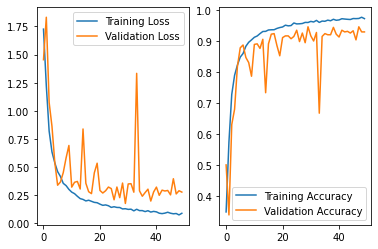

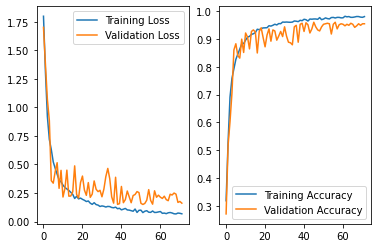

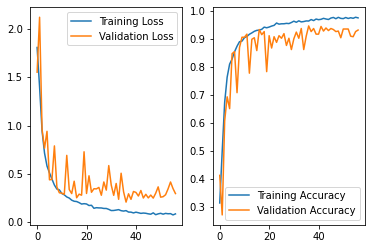

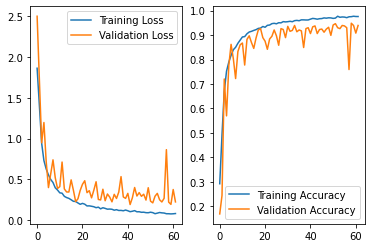

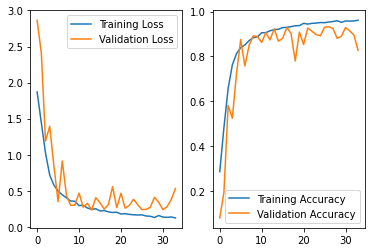

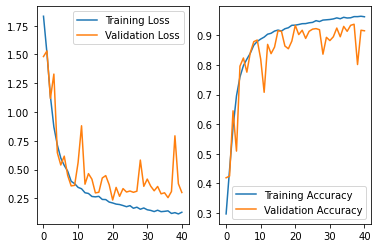

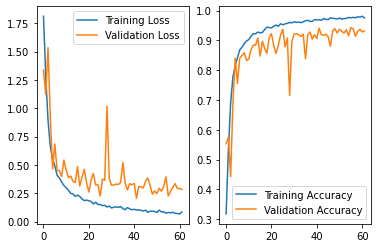

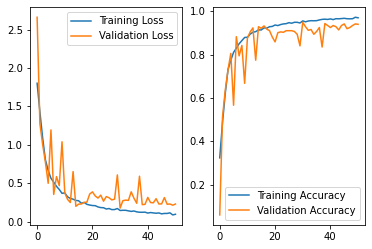

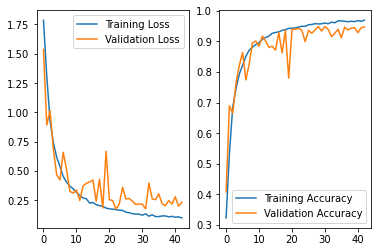

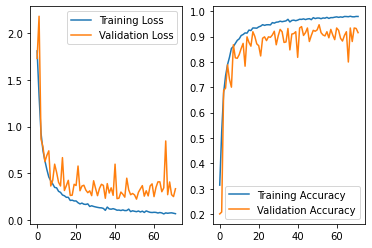

In [16]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [17]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.00828255 0.         0.         0.         0.         0.
 0.         0.        ]
precision sdev by class [0.00165125 0.         0.         0.         0.         0.
 0.         0.        ]
macro precision mean 0.0010353182548238763
macro precision sdev 0.00020640579817485835
recall mean [1. 0. 0. 0. 0. 0. 0. 0.]
recall sdev [0. 0. 0. 0. 0. 0. 0. 0.]
macro recall mean 0.125
macro recall sdev 0.0
f1 mean [0.0164237 0.        0.        0.        0.        0.        0.
 0.       ]
f1 sdev [0.00324847 0.         0.         0.         0.         0.
 0.         0.        ]
macro f1 mean 0.0020529622526532206
macro f1 sdev 0.0004060584946303837
accuracy mean 0.00828254603859101
accuracy sdev 0.0016512463853988668


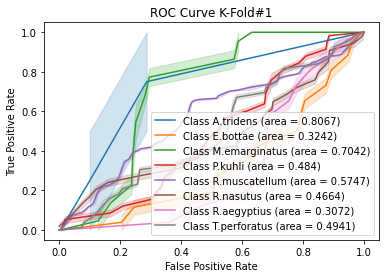

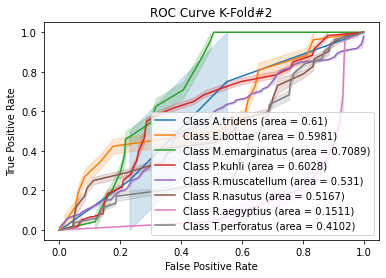

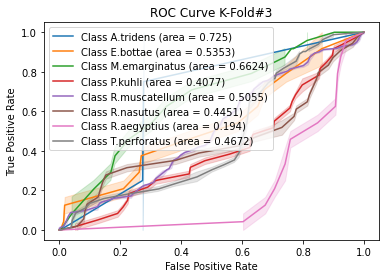

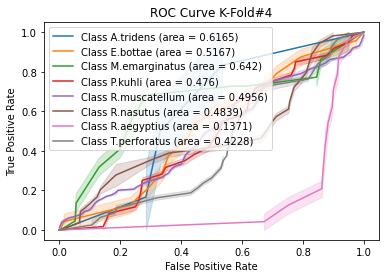

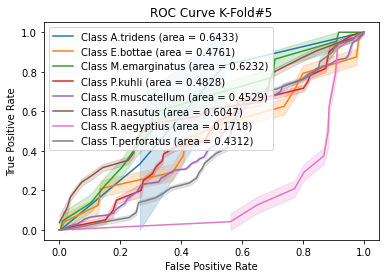

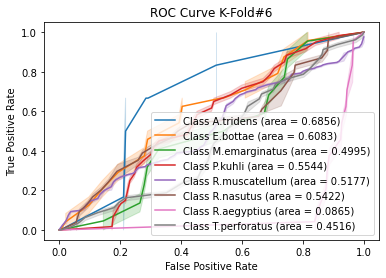

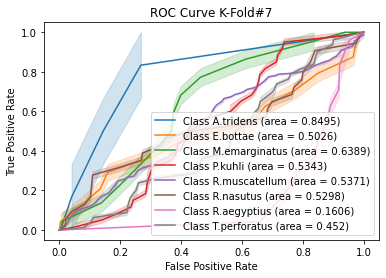

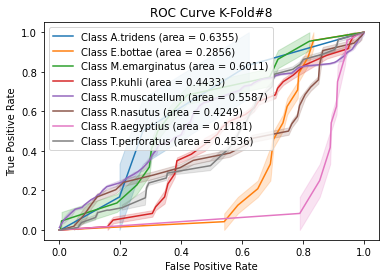

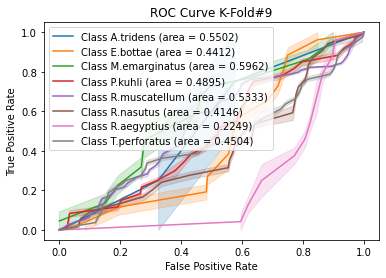

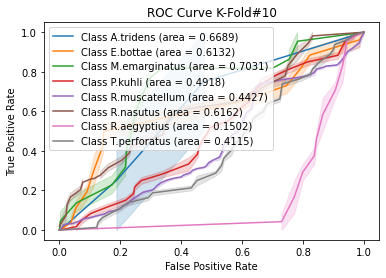

In [18]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [19]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.6791053511705686
Std  0.087217886702729
Sp:  E.bottae
AUC Mean  0.49014782367932347
Std  0.1075301497757364
Sp:  M.emarginatus
AUC Mean  0.6379478395759945
Std  0.06062721489316361
Sp:  P.kuhli
AUC Mean  0.49666123031450493
Std  0.052566943941829584
Sp:  R.muscatellum
AUC Mean  0.5149115327499187
Std  0.040137783139508436
Sp:  R.nasutus
AUC Mean  0.5044645925439324
Std  0.06675876609184155
Sp:  R.aegyptius
AUC Mean  0.1701557016940026
Std  0.05830152280032735
Sp:  T.perforatus
AUC Mean  0.444454983785492
Std  0.024713113394136274


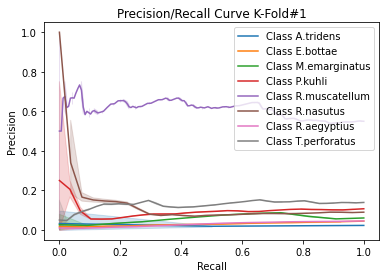

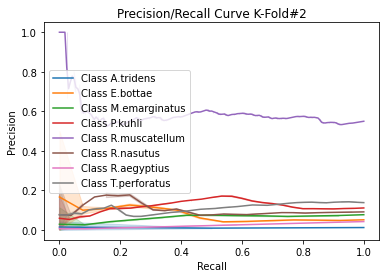

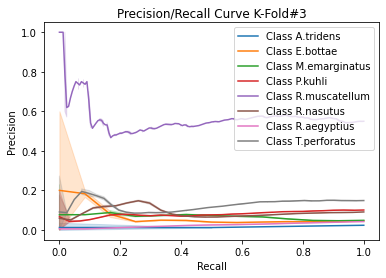

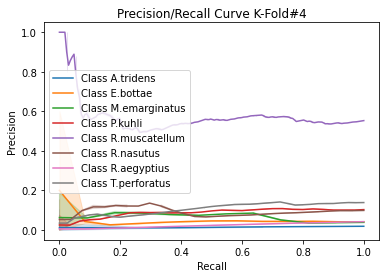

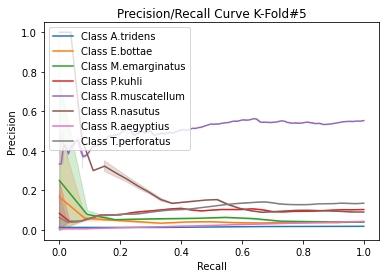

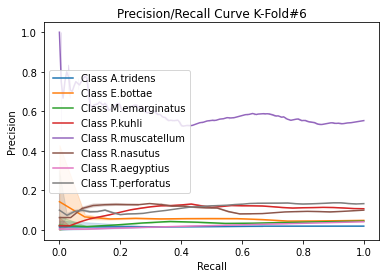

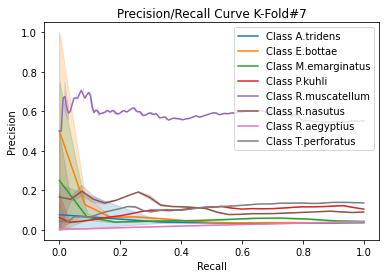

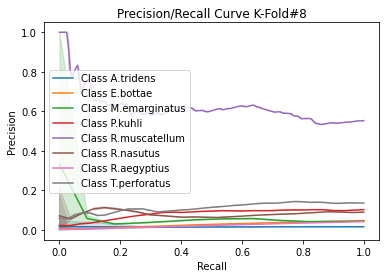

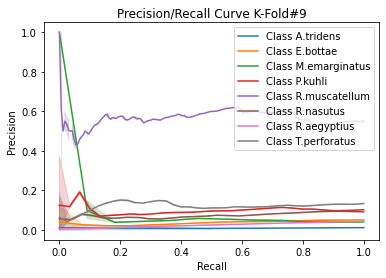

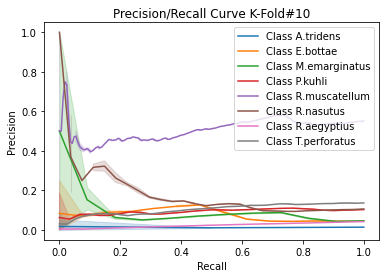

In [20]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [ 13   0   0   0   0   0   0   0]
 [ 11   0   0   0   0   0   0   0]
 [ 29   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 27   0   0   0   0   0   0   0]
 [ 13   0   0   0   0   0   0   0]
 [ 41   0   0   0   0   0   0   0]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [ 13   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 30   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 26   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 41   0   0   0   0   0   0   0]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 30   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 27   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 41   0   0   0   0   0   0   0]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [ 1

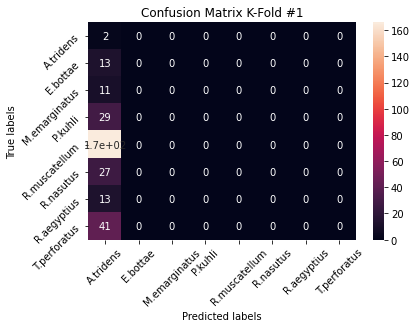

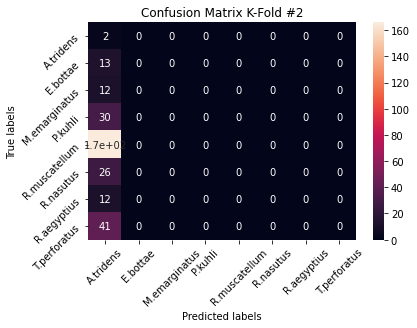

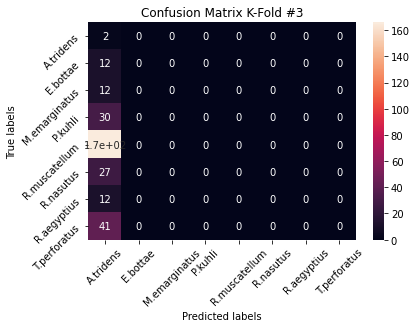

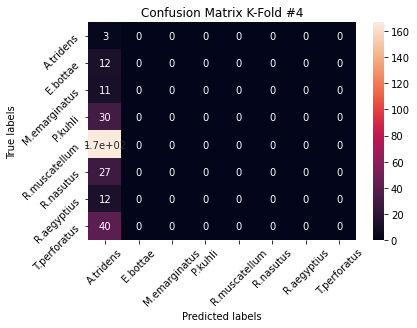

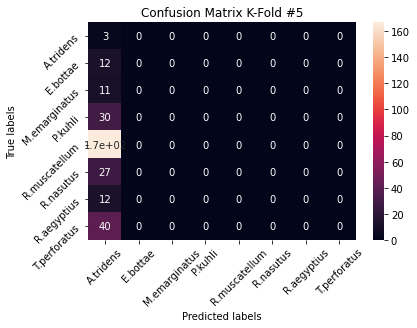

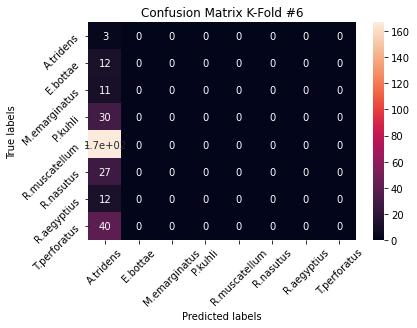

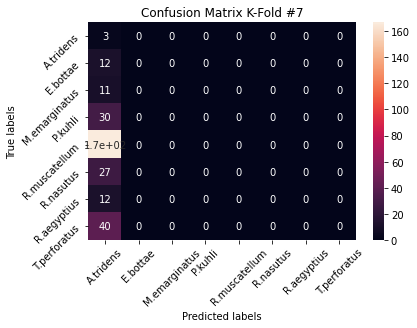

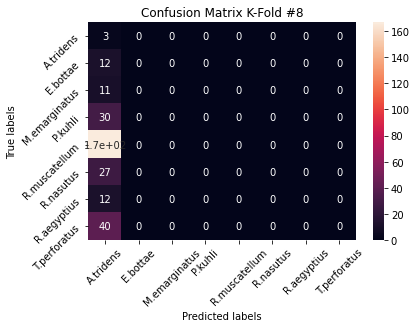

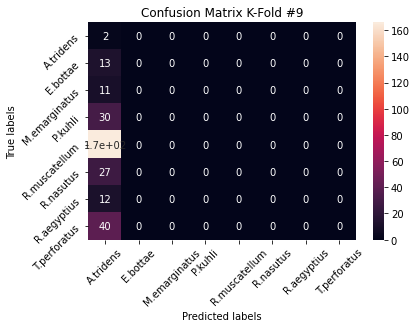

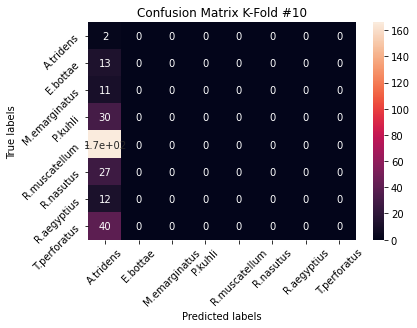

In [21]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  25    0    0    0    0    0    0    0]
 [ 124    0    0    0    0    0    0    0]
 [ 112    0    0    0    0    0    0    0]
 [ 299    0    0    0    0    0    0    0]
 [1665    0    0    0    0    0    0    0]
 [ 269    0    0    0    0    0    0    0]
 [ 121    0    0    0    0    0    0    0]
 [ 403    0    0    0    0    0    0    0]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 11   0   0   0   0   0   0   0]
 [ 29   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 26   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 40   0   0   0   0   0   0   0]]


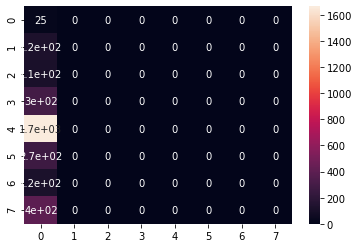

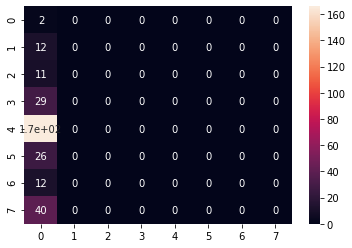

In [22]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]]


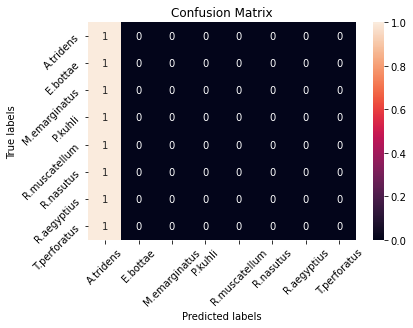

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V2 !!!!! K-Fold Training and Evaluation</h2>

In [24]:
folder = "models"
mode_version = "spec_smote_v2"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v2


In [25]:
 def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=24,kernel_size=(5,5),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=56,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=136,kernel_size=(7,7),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=120,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(512)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.4)(lay)

    lay = Dense(256)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.3)(lay)

    lay = Dense(128)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.2)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [26]:

model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 56, 85, 16)        2368      
_________________________________________________________________
batch_normalization_7 (Batch (None, 56, 85, 16)        64        
_________________________________________________________________
activation_7 (Activation)    (None, 56, 85, 16)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 28, 43, 16)        0         
_________________________________________________________________
spatial_dropout2d_4 (Spatial (None, 28, 43, 16)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 14, 22, 64)        2566

In [27]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 5s - loss: 1.8875 - accuracy: 0.2840 - val_loss: 1.4933 - val_accuracy: 0.5662
Epoch 2/100
1199/1199 - 6s - loss: 1.4754 - accuracy: 0.4593 - val_loss: 1.4921 - val_accuracy: 0.3897
Epoch 3/100
1199/1199 - 6s - loss: 0.9725 - accuracy: 0.6660 - val_loss: 2.0053 - val_accuracy: 0.3088
Epoch 4/100
1199/1199 - 5s - loss: 0.7031 - accuracy: 0.7637 - val_loss: 3.0278 - val_accuracy: 0.3254
Epoch 5/100
1199/1199 - 6s - loss: 0.5777 - accuracy: 0.8062 - val_loss: 0.7749 - val_accuracy: 0.7316

Epoch 4/100
1199/1199 - 5s - loss: 0.7102 - accuracy: 0.7640 - val_loss: 1.2723 - val_accuracy: 0.6176
Epoch 5/100
1199/1199 - 6s - loss: 0.5850 - accuracy: 0.8108 - val_loss: 0.3845 - val_accuracy: 0.8750
Epoch 6/100
1199/1199 - 5s - loss: 0.4791 - accuracy: 0.8416 - val_loss: 0.5559 - val_accuracy: 0.8051
Epoch 7/100
1199/1199 - 5s - loss: 0.4201 - accuracy: 0.8668 - val_loss: 0.4752 - val_accuracy: 0.8290
Epoch 8/100
1199/1199 - 5s - loss: 0.3813 - accuracy: 0.8783 - val_loss: 0.3889 - val_accuracy: 0.8787
Epoch 9/100
1199/1199 - 5s - loss: 0.3334 - accuracy: 0.8919 - val_loss: 0.5280 - val_accuracy: 0.8290
Epoch 10/100
1199/1199 - 5s - loss: 0.2777 - accuracy: 0.9096 - val_loss: 1.1540 - val_accuracy: 0.7353
Epoch 11/100
1199/1199 - 5s - loss: 0.2548 - accuracy: 0.9197 - val_loss: 0.2873 - val_accuracy: 0.9062
Epoch 12/100
1199/1199 - 6s - loss: 0.2493 - accuracy: 0.9201 - val_loss: 0.2858 - val_accuracy: 0.9044
Epoch 13/100
1199/1199 - 5s - loss: 0.2167 - accuracy: 0.9281 - val_lo

Epoch 18/100
1199/1199 - 5s - loss: 0.1824 - accuracy: 0.9420 - val_loss: 0.5221 - val_accuracy: 0.8217
Epoch 19/100
1199/1199 - 5s - loss: 0.1717 - accuracy: 0.9467 - val_loss: 0.2636 - val_accuracy: 0.9154
Epoch 20/100
1199/1199 - 5s - loss: 0.1686 - accuracy: 0.9470 - val_loss: 0.3346 - val_accuracy: 0.8897
Epoch 21/100
1199/1199 - 5s - loss: 0.1512 - accuracy: 0.9509 - val_loss: 0.3761 - val_accuracy: 0.9081
Epoch 22/100
1199/1199 - 6s - loss: 0.1500 - accuracy: 0.9512 - val_loss: 0.2674 - val_accuracy: 0.9246
Epoch 23/100
1199/1199 - 5s - loss: 0.1453 - accuracy: 0.9563 - val_loss: 0.2845 - val_accuracy: 0.9320
Epoch 24/100
1199/1199 - 5s - loss: 0.1250 - accuracy: 0.9605 - val_loss: 0.4111 - val_accuracy: 0.8750
Epoch 25/100
1199/1199 - 5s - loss: 0.1246 - accuracy: 0.9593 - val_loss: 0.2387 - val_accuracy: 0.9357
Epoch 26/100
1199/1199 - 6s - loss: 0.1209 - accuracy: 0.9599 - val_loss: 0.2902 - val_accuracy: 0.9081
Epoch 27/100
1199/1199 - 5s - loss: 0.1206 - accuracy: 0.9625 - 

Epoch 6/100
1198/1198 - 6s - loss: 0.4523 - accuracy: 0.8520 - val_loss: 0.4619 - val_accuracy: 0.8217
Epoch 7/100
1198/1198 - 6s - loss: 0.4032 - accuracy: 0.8682 - val_loss: 0.2763 - val_accuracy: 0.9118
Epoch 8/100
1198/1198 - 6s - loss: 0.3410 - accuracy: 0.8902 - val_loss: 0.3845 - val_accuracy: 0.8640
Epoch 9/100
1198/1198 - 5s - loss: 0.3120 - accuracy: 0.8998 - val_loss: 0.5895 - val_accuracy: 0.8272
Epoch 10/100
1198/1198 - 5s - loss: 0.2756 - accuracy: 0.9100 - val_loss: 0.3111 - val_accuracy: 0.9173
Epoch 11/100
1198/1198 - 5s - loss: 0.2567 - accuracy: 0.9172 - val_loss: 0.4498 - val_accuracy: 0.8456
Epoch 12/100
1198/1198 - 6s - loss: 0.2487 - accuracy: 0.9207 - val_loss: 0.2225 - val_accuracy: 0.9283
Epoch 13/100
1198/1198 - 5s - loss: 0.2150 - accuracy: 0.9313 - val_loss: 0.2909 - val_accuracy: 0.9265
Epoch 14/100
1198/1198 - 6s - loss: 0.1911 - accuracy: 0.9358 - val_loss: 0.2321 - val_accuracy: 0.9375
Epoch 15/100
1198/1198 - 5s - loss: 0.1892 - accuracy: 0.9391 - val_

Epoch 35/100
1198/1198 - 5s - loss: 0.0860 - accuracy: 0.9735 - val_loss: 0.4058 - val_accuracy: 0.8768
Epoch 36/100
1198/1198 - 5s - loss: 0.1021 - accuracy: 0.9727 - val_loss: 0.2426 - val_accuracy: 0.9210
Epoch 37/100
1198/1198 - 5s - loss: 0.0821 - accuracy: 0.9759 - val_loss: 0.2418 - val_accuracy: 0.9375
Epoch 38/100
1198/1198 - 5s - loss: 0.0817 - accuracy: 0.9761 - val_loss: 0.3504 - val_accuracy: 0.9154
Epoch 39/100
1198/1198 - 5s - loss: 0.0701 - accuracy: 0.9784 - val_loss: 0.6705 - val_accuracy: 0.8474
Epoch 40/100
1198/1198 - 5s - loss: 0.0675 - accuracy: 0.9783 - val_loss: 0.3203 - val_accuracy: 0.9154
Epoch 41/100
1198/1198 - 5s - loss: 0.0738 - accuracy: 0.9777 - val_loss: 0.2456 - val_accuracy: 0.9338
Epoch 42/100
1198/1198 - 5s - loss: 0.0707 - accuracy: 0.9792 - val_loss: 0.4228 - val_accuracy: 0.8915
Epoch 43/100
1198/1198 - 5s - loss: 0.0746 - accuracy: 0.9781 - val_loss: 0.2745 - val_accuracy: 0.9320
Epoch 44/100
1198/1198 - 5s - loss: 0.0605 - accuracy: 0.9810 - 

Epoch 7/100
1198/1198 - 5s - loss: 0.3937 - accuracy: 0.8720 - val_loss: 0.3577 - val_accuracy: 0.8585
Epoch 8/100
1198/1198 - 6s - loss: 0.3455 - accuracy: 0.8896 - val_loss: 0.5456 - val_accuracy: 0.7904
Epoch 9/100
1198/1198 - 5s - loss: 0.3253 - accuracy: 0.8959 - val_loss: 0.4833 - val_accuracy: 0.8199
Epoch 10/100
1198/1198 - 5s - loss: 0.2746 - accuracy: 0.9144 - val_loss: 0.3861 - val_accuracy: 0.8640
Epoch 11/100
1198/1198 - 6s - loss: 0.2550 - accuracy: 0.9178 - val_loss: 0.5612 - val_accuracy: 0.8125
Epoch 12/100
1198/1198 - 6s - loss: 0.2364 - accuracy: 0.9239 - val_loss: 0.3089 - val_accuracy: 0.8952
Epoch 13/100
1198/1198 - 6s - loss: 0.2345 - accuracy: 0.9249 - val_loss: 0.2464 - val_accuracy: 0.9338
Epoch 14/100
1198/1198 - 5s - loss: 0.2004 - accuracy: 0.9379 - val_loss: 0.4345 - val_accuracy: 0.8474
Epoch 15/100
1198/1198 - 6s - loss: 0.1936 - accuracy: 0.9378 - val_loss: 0.3231 - val_accuracy: 0.9007
Epoch 16/100
1198/1198 - 5s - loss: 0.1968 - accuracy: 0.9377 - val

Epoch 28/100
1199/1199 - 5s - loss: 0.0946 - accuracy: 0.9701 - val_loss: 0.2695 - val_accuracy: 0.9467
Epoch 29/100
1199/1199 - 5s - loss: 0.1011 - accuracy: 0.9696 - val_loss: 0.2681 - val_accuracy: 0.9173
Epoch 30/100
1199/1199 - 5s - loss: 0.1018 - accuracy: 0.9666 - val_loss: 0.2108 - val_accuracy: 0.9485
Epoch 31/100
1199/1199 - 5s - loss: 0.1065 - accuracy: 0.9667 - val_loss: 0.1941 - val_accuracy: 0.9485
Epoch 32/100
1199/1199 - 5s - loss: 0.0936 - accuracy: 0.9689 - val_loss: 0.6691 - val_accuracy: 0.8143
Epoch 33/100
1199/1199 - 5s - loss: 0.0999 - accuracy: 0.9686 - val_loss: 0.2829 - val_accuracy: 0.9283
Epoch 34/100
1199/1199 - 5s - loss: 0.0876 - accuracy: 0.9723 - val_loss: 0.2113 - val_accuracy: 0.9540
Epoch 35/100
1199/1199 - 5s - loss: 0.1011 - accuracy: 0.9690 - val_loss: 0.1898 - val_accuracy: 0.9522
Epoch 36/100
1199/1199 - 5s - loss: 0.0765 - accuracy: 0.9756 - val_loss: 0.4791 - val_accuracy: 0.8713
Epoch 37/100
1199/1199 - 5s - loss: 0.0872 - accuracy: 0.9738 - 

Epoch 18/100
1199/1199 - 5s - loss: 0.1647 - accuracy: 0.9454 - val_loss: 0.3747 - val_accuracy: 0.8768
Epoch 19/100
1199/1199 - 5s - loss: 0.1533 - accuracy: 0.9533 - val_loss: 0.3550 - val_accuracy: 0.8989
Epoch 20/100
1199/1199 - 5s - loss: 0.1530 - accuracy: 0.9519 - val_loss: 0.8277 - val_accuracy: 0.7224
Epoch 21/100
1199/1199 - 5s - loss: 0.1370 - accuracy: 0.9563 - val_loss: 0.6355 - val_accuracy: 0.8107
Epoch 22/100
1199/1199 - 6s - loss: 0.1246 - accuracy: 0.9612 - val_loss: 0.3337 - val_accuracy: 0.9173
Epoch 23/100
1199/1199 - 6s - loss: 0.1236 - accuracy: 0.9625 - val_loss: 0.2787 - val_accuracy: 0.9228
Epoch 24/100
1199/1199 - 5s - loss: 0.1218 - accuracy: 0.9608 - val_loss: 0.3762 - val_accuracy: 0.8860
Epoch 25/100
1199/1199 - 6s - loss: 0.1111 - accuracy: 0.9652 - val_loss: 0.5575 - val_accuracy: 0.8364
Epoch 26/100
1199/1199 - 5s - loss: 0.1082 - accuracy: 0.9661 - val_loss: 0.2898 - val_accuracy: 0.9136
Epoch 27/100
1199/1199 - 5s - loss: 0.1070 - accuracy: 0.9661 - 

# LOAD AND EVAL

In [28]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [29]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 87), ('T.perforatus', 290), ('P.kuhli', 215), ('A.tridens', 18), ('M.emarginatus', 80)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 289), ('R.muscatellum', 1199), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('M.emarginatus', 80), ('R.nasutus', 194), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('E.bottae', 1199), ('R.aegyptius', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.nasutus', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


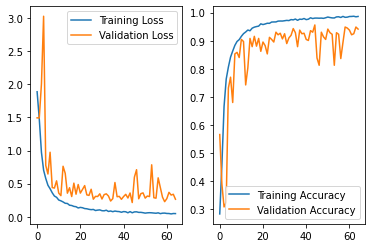

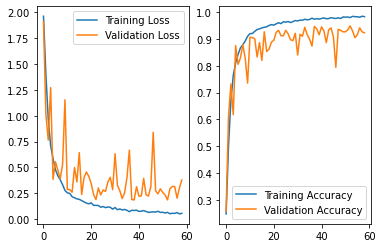

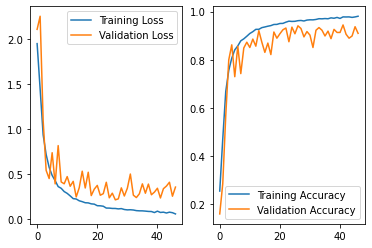

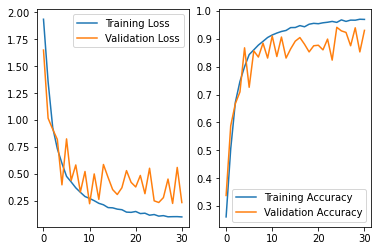

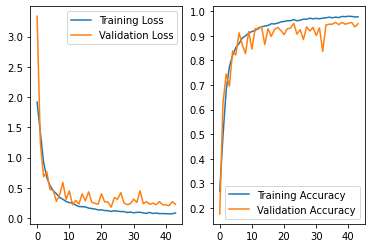

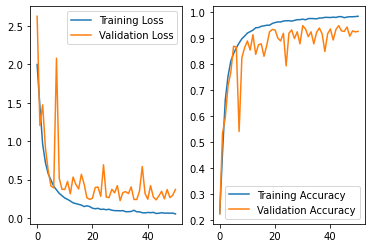

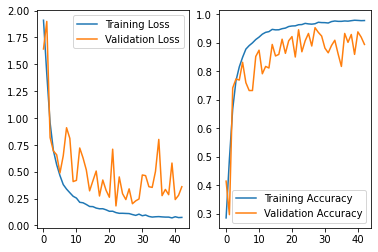

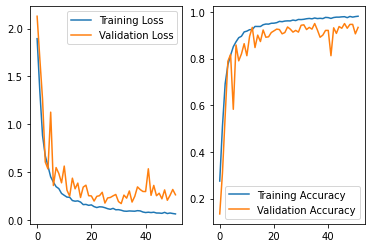

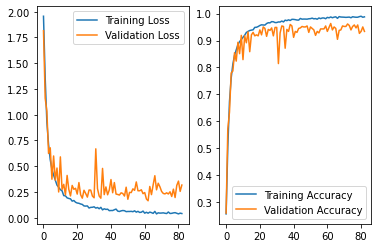

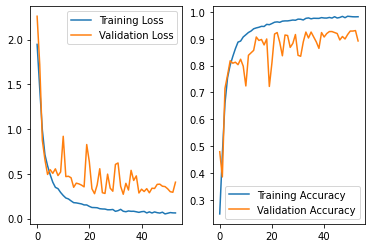

In [30]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [31]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.00828255 0.         0.         0.         0.         0.
 0.         0.        ]
precision sdev by class [0.00165125 0.         0.         0.         0.         0.
 0.         0.        ]
macro precision mean 0.0010353182548238763
macro precision sdev 0.00020640579817485835
recall mean [1. 0. 0. 0. 0. 0. 0. 0.]
recall sdev [0. 0. 0. 0. 0. 0. 0. 0.]
macro recall mean 0.125
macro recall sdev 0.0
f1 mean [0.0164237 0.        0.        0.        0.        0.        0.
 0.       ]
f1 sdev [0.00324847 0.         0.         0.         0.         0.
 0.         0.        ]
macro f1 mean 0.0020529622526532206
macro f1 sdev 0.0004060584946303837
accuracy mean 0.00828254603859101
accuracy sdev 0.0016512463853988668


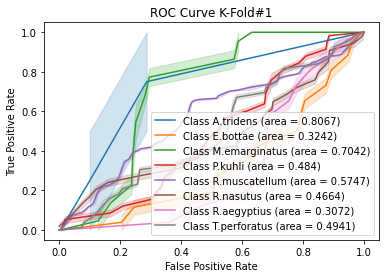

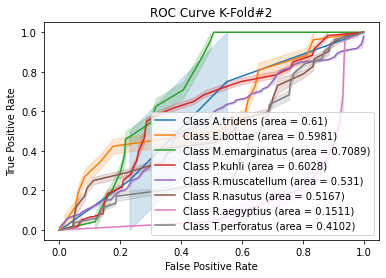

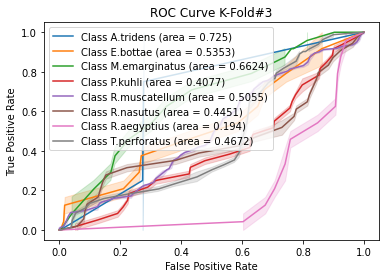

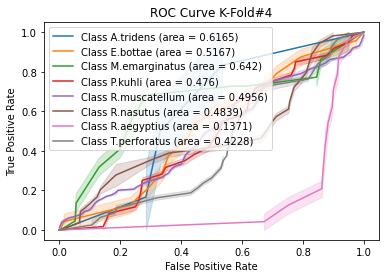

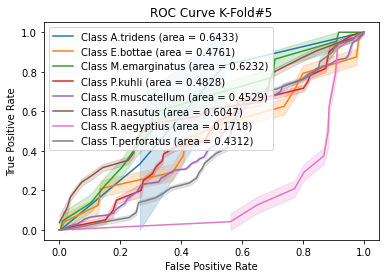

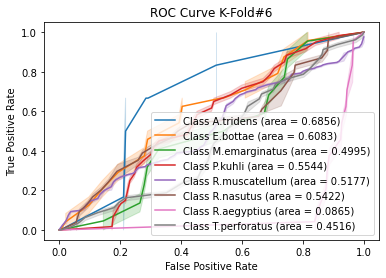

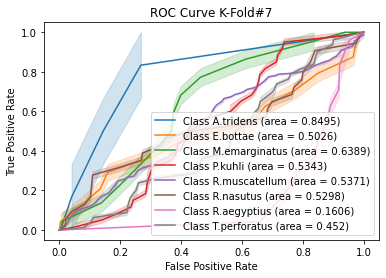

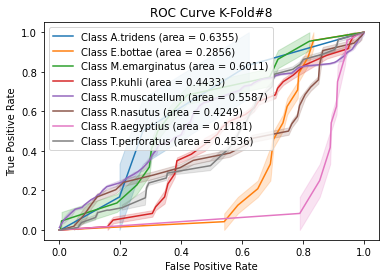

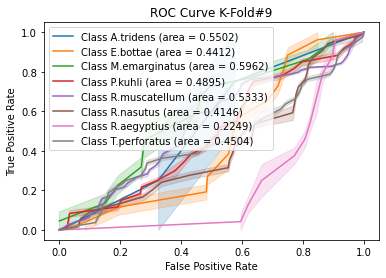

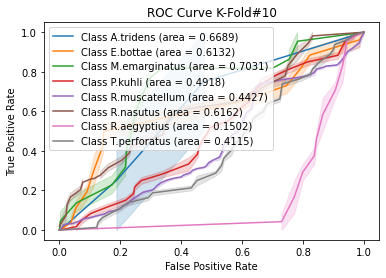

In [32]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [33]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.6791053511705686
Std  0.087217886702729
Sp:  E.bottae
AUC Mean  0.49014782367932347
Std  0.1075301497757364
Sp:  M.emarginatus
AUC Mean  0.6379478395759945
Std  0.06062721489316361
Sp:  P.kuhli
AUC Mean  0.49666123031450493
Std  0.052566943941829584
Sp:  R.muscatellum
AUC Mean  0.5149115327499187
Std  0.040137783139508436
Sp:  R.nasutus
AUC Mean  0.5044645925439324
Std  0.06675876609184155
Sp:  R.aegyptius
AUC Mean  0.1701557016940026
Std  0.05830152280032735
Sp:  T.perforatus
AUC Mean  0.444454983785492
Std  0.024713113394136274


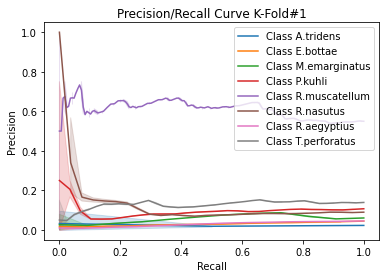

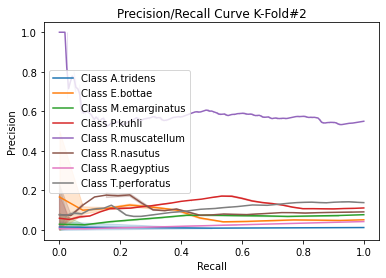

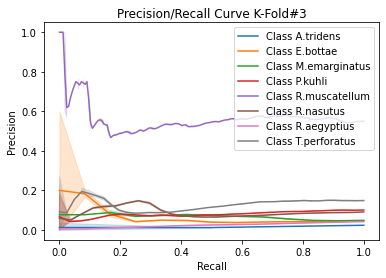

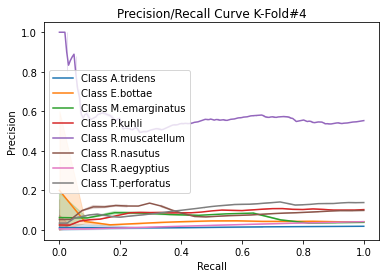

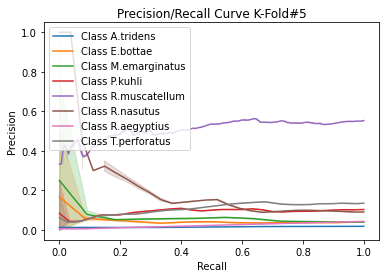

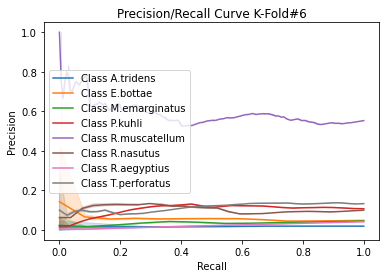

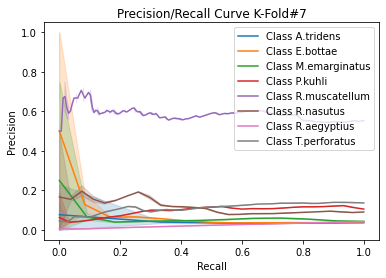

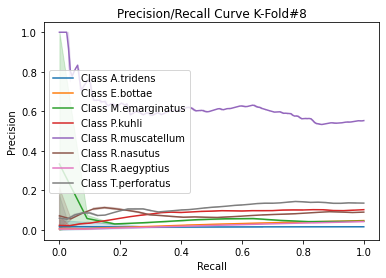

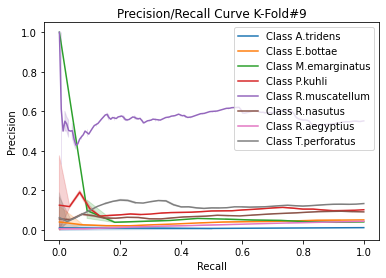

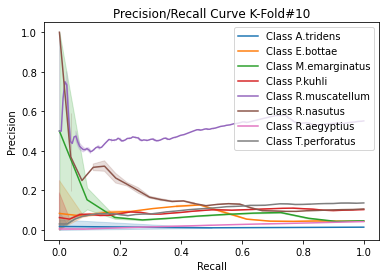

In [34]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [ 13   0   0   0   0   0   0   0]
 [ 11   0   0   0   0   0   0   0]
 [ 29   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 27   0   0   0   0   0   0   0]
 [ 13   0   0   0   0   0   0   0]
 [ 41   0   0   0   0   0   0   0]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [ 13   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 30   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 26   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 41   0   0   0   0   0   0   0]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 30   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 27   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 41   0   0   0   0   0   0   0]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [ 1

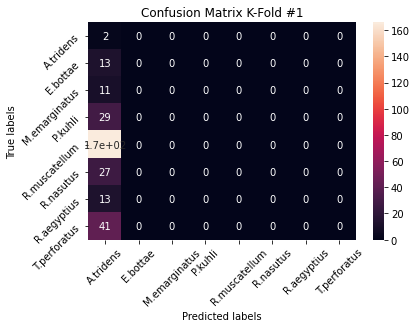

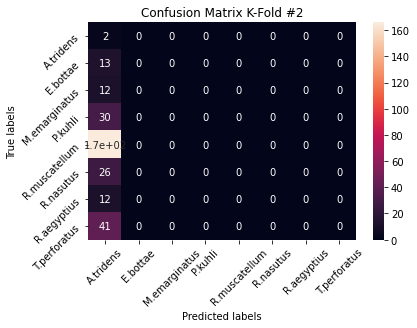

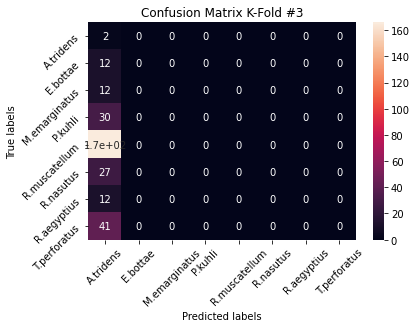

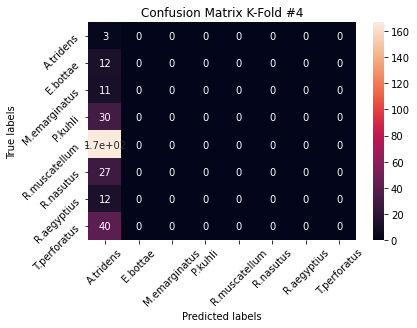

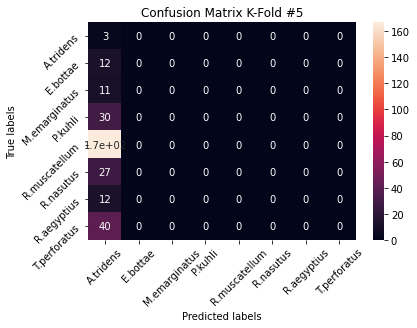

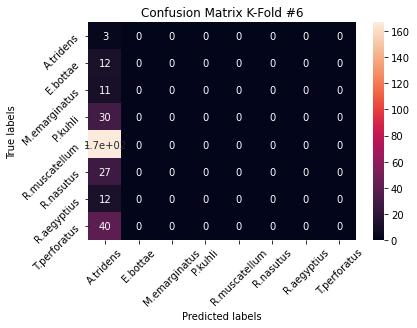

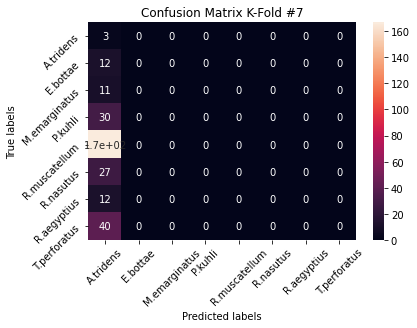

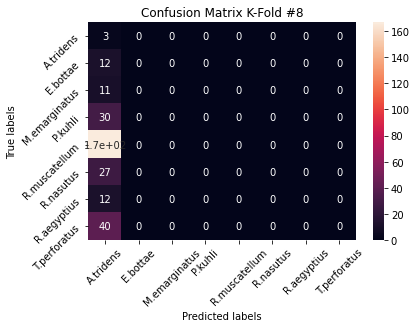

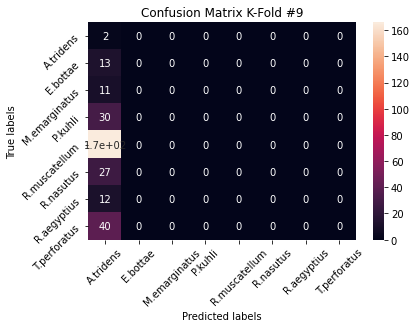

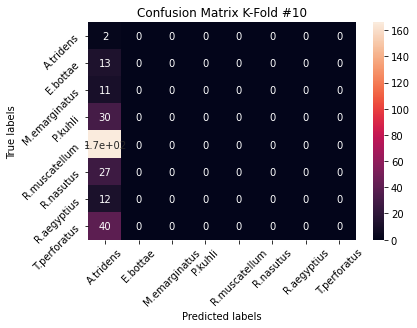

In [35]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  25    0    0    0    0    0    0    0]
 [ 124    0    0    0    0    0    0    0]
 [ 112    0    0    0    0    0    0    0]
 [ 299    0    0    0    0    0    0    0]
 [1665    0    0    0    0    0    0    0]
 [ 269    0    0    0    0    0    0    0]
 [ 121    0    0    0    0    0    0    0]
 [ 403    0    0    0    0    0    0    0]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 11   0   0   0   0   0   0   0]
 [ 29   0   0   0   0   0   0   0]
 [166   0   0   0   0   0   0   0]
 [ 26   0   0   0   0   0   0   0]
 [ 12   0   0   0   0   0   0   0]
 [ 40   0   0   0   0   0   0   0]]


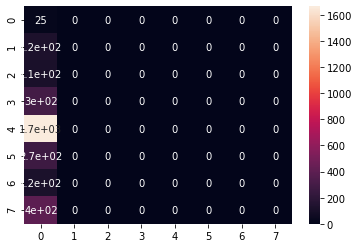

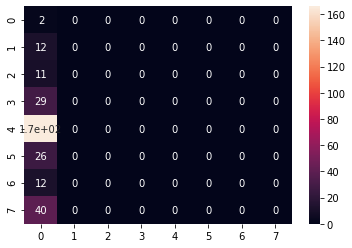

In [36]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]]


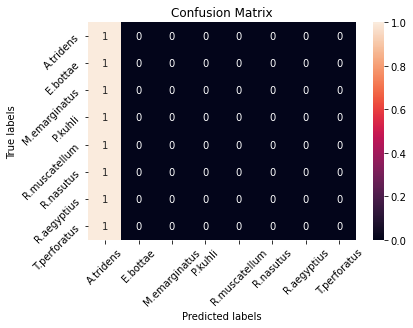

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V3 !!!!! K-Fold Training and Evaluation</h2>

In [38]:
folder = "models"
mode_version = "spec_smote_v3"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v3


In [39]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=176,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=48,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=144,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=192,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(144)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(80)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(96)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [40]:
model = build_current_model()
model.summary()

Model: "model_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 56, 85, 176)       26048     
_________________________________________________________________
batch_normalization_154 (Bat (None, 56, 85, 176)       704       
_________________________________________________________________
activation_154 (Activation)  (None, 56, 85, 176)       0         
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 28, 43, 176)       0         
_________________________________________________________________
spatial_dropout2d_88 (Spatia (None, 28, 43, 176)       0         
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 14, 22, 48)        211

In [41]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 8s - loss: 1.7937 - accuracy: 0.3195 - val_loss: 1.6855 - val_accuracy: 0.3346
Epoch 2/100
1199/1199 - 8s - loss: 1.3381 - accuracy: 0.5196 - val_loss: 2.0127 - val_accuracy: 0.5092
Epoch 3/100
1199/1199 - 8s - loss: 0.9325 - accuracy: 0.6842 - val_loss: 0.9442 - val_accuracy: 0.6783
Epoch 4/100
1199/1199 - 8s - loss: 0.7149 - accuracy: 0.7555 - val_loss: 0.7475 - val_accuracy: 0.7059
Epoch 5/100
1199/1199 - 9s - loss: 0.5639 - accuracy: 0.8111 - val_loss: 0.6612 - val_accuracy: 0.7555

Epoch 27/100
1199/1199 - 9s - loss: 0.1081 - accuracy: 0.9652 - val_loss: 0.1864 - val_accuracy: 0.9504
Epoch 28/100
1199/1199 - 9s - loss: 0.1248 - accuracy: 0.9627 - val_loss: 0.1609 - val_accuracy: 0.9412
Epoch 29/100
1199/1199 - 9s - loss: 0.0921 - accuracy: 0.9708 - val_loss: 0.1655 - val_accuracy: 0.9357
Epoch 30/100
1199/1199 - 9s - loss: 0.1055 - accuracy: 0.9658 - val_loss: 0.2193 - val_accuracy: 0.9283
Epoch 31/100
1199/1199 - 9s - loss: 0.0936 - accuracy: 0.9690 - val_loss: 0.2563 - val_accuracy: 0.9228
Epoch 32/100
1199/1199 - 9s - loss: 0.0968 - accuracy: 0.9715 - val_loss: 0.1700 - val_accuracy: 0.9559
Epoch 33/100
1199/1199 - 9s - loss: 0.0868 - accuracy: 0.9728 - val_loss: 0.1826 - val_accuracy: 0.9504
Epoch 34/100
1199/1199 - 9s - loss: 0.0940 - accuracy: 0.9709 - val_loss: 0.2433 - val_accuracy: 0.9393
Epoch 35/100
1199/1199 - 9s - loss: 0.0934 - accuracy: 0.9720 - val_loss: 0.3030 - val_accuracy: 0.9228
Epoch 36/100
1199/1199 - 9s - loss: 0.0923 - accuracy: 0.9716 - 

Epoch 34/100
1199/1199 - 9s - loss: 0.0755 - accuracy: 0.9764 - val_loss: 0.3266 - val_accuracy: 0.9210
Epoch 35/100
1199/1199 - 9s - loss: 0.0814 - accuracy: 0.9755 - val_loss: 0.2357 - val_accuracy: 0.9412
Epoch 36/100
1199/1199 - 9s - loss: 0.0865 - accuracy: 0.9727 - val_loss: 0.4647 - val_accuracy: 0.8695
Epoch 37/100
1199/1199 - 9s - loss: 0.0694 - accuracy: 0.9795 - val_loss: 0.2962 - val_accuracy: 0.9301
Epoch 38/100
1199/1199 - 9s - loss: 0.0833 - accuracy: 0.9756 - val_loss: 0.3755 - val_accuracy: 0.8897
Epoch 39/100
1199/1199 - 9s - loss: 0.0839 - accuracy: 0.9746 - val_loss: 0.2521 - val_accuracy: 0.9265
Epoch 40/100
1199/1199 - 9s - loss: 0.0647 - accuracy: 0.9788 - val_loss: 0.3484 - val_accuracy: 0.9081
Epoch 41/100
1199/1199 - 9s - loss: 0.0738 - accuracy: 0.9772 - val_loss: 0.3089 - val_accuracy: 0.9210
Epoch 42/100
1199/1199 - 9s - loss: 0.0676 - accuracy: 0.9798 - val_loss: 0.2489 - val_accuracy: 0.9265
Epoch 43/100
1199/1199 - 9s - loss: 0.0784 - accuracy: 0.9773 - 

Epoch 38/100
1198/1198 - 9s - loss: 0.0800 - accuracy: 0.9749 - val_loss: 0.3654 - val_accuracy: 0.9210
Epoch 39/100
1198/1198 - 9s - loss: 0.0890 - accuracy: 0.9721 - val_loss: 0.4027 - val_accuracy: 0.9228
Epoch 40/100
1198/1198 - 9s - loss: 0.0732 - accuracy: 0.9790 - val_loss: 0.2583 - val_accuracy: 0.9283
Epoch 41/100
1198/1198 - 9s - loss: 0.0820 - accuracy: 0.9771 - val_loss: 0.2826 - val_accuracy: 0.9246
Epoch 42/100
1198/1198 - 9s - loss: 0.0712 - accuracy: 0.9781 - val_loss: 0.3239 - val_accuracy: 0.9026
Epoch 43/100
1198/1198 - 9s - loss: 0.0654 - accuracy: 0.9811 - val_loss: 0.2066 - val_accuracy: 0.9485
Epoch 44/100
1198/1198 - 9s - loss: 0.0786 - accuracy: 0.9764 - val_loss: 0.3153 - val_accuracy: 0.9301
Epoch 45/100
1198/1198 - 9s - loss: 0.0679 - accuracy: 0.9788 - val_loss: 0.2206 - val_accuracy: 0.9393
Epoch 46/100
1198/1198 - 9s - loss: 0.0629 - accuracy: 0.9818 - val_loss: 0.3048 - val_accuracy: 0.9210
Epoch 47/100
1198/1198 - 9s - loss: 0.0693 - accuracy: 0.9787 - 

Epoch 40/100
1198/1198 - 9s - loss: 0.0862 - accuracy: 0.9739 - val_loss: 0.2365 - val_accuracy: 0.9265
Epoch 41/100
1198/1198 - 9s - loss: 0.0745 - accuracy: 0.9771 - val_loss: 0.2925 - val_accuracy: 0.9136
Epoch 42/100
Restoring model weights from the end of the best epoch.
1198/1198 - 9s - loss: 0.0811 - accuracy: 0.9740 - val_loss: 0.3154 - val_accuracy: 0.9301
Epoch 00042: early stopping
models/spec_smote_v3_iter_5.model
INFO:tensorflow:Assets written to: models/spec_smote_v3_iter_5.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/

Epoch 12/100
1198/1198 - 9s - loss: 0.2290 - accuracy: 0.9238 - val_loss: 0.4446 - val_accuracy: 0.8272
Epoch 13/100
1198/1198 - 9s - loss: 0.2107 - accuracy: 0.9311 - val_loss: 0.9510 - val_accuracy: 0.6893
Epoch 14/100
1198/1198 - 9s - loss: 0.2005 - accuracy: 0.9367 - val_loss: 0.2721 - val_accuracy: 0.9173
Epoch 15/100
1198/1198 - 9s - loss: 0.1902 - accuracy: 0.9386 - val_loss: 0.3708 - val_accuracy: 0.8842
Epoch 16/100
1198/1198 - 9s - loss: 0.1681 - accuracy: 0.9463 - val_loss: 0.3032 - val_accuracy: 0.9007
Epoch 17/100
1198/1198 - 9s - loss: 0.1741 - accuracy: 0.9444 - val_loss: 0.3114 - val_accuracy: 0.9026
Epoch 18/100
1198/1198 - 9s - loss: 0.1497 - accuracy: 0.9515 - val_loss: 0.3169 - val_accuracy: 0.9136
Epoch 19/100
1198/1198 - 9s - loss: 0.1403 - accuracy: 0.9546 - val_loss: 0.3644 - val_accuracy: 0.8695
Epoch 20/100
1198/1198 - 9s - loss: 0.1456 - accuracy: 0.9539 - val_loss: 0.4566 - val_accuracy: 0.8474
Epoch 21/100
1198/1198 - 9s - loss: 0.1326 - accuracy: 0.9580 - 

Epoch 10/100
1198/1198 - 9s - loss: 0.2991 - accuracy: 0.9038 - val_loss: 0.4800 - val_accuracy: 0.8364
Epoch 11/100
1198/1198 - 9s - loss: 0.2727 - accuracy: 0.9114 - val_loss: 0.4749 - val_accuracy: 0.8070
Epoch 12/100
1198/1198 - 9s - loss: 0.2573 - accuracy: 0.9186 - val_loss: 0.2994 - val_accuracy: 0.8971
Epoch 13/100
1198/1198 - 9s - loss: 0.2355 - accuracy: 0.9261 - val_loss: 0.3221 - val_accuracy: 0.8934
Epoch 14/100
1198/1198 - 9s - loss: 0.2109 - accuracy: 0.9312 - val_loss: 0.4424 - val_accuracy: 0.8438
Epoch 15/100
1198/1198 - 9s - loss: 0.1955 - accuracy: 0.9391 - val_loss: 0.2541 - val_accuracy: 0.9265
Epoch 16/100
1198/1198 - 9s - loss: 0.1882 - accuracy: 0.9380 - val_loss: 0.2554 - val_accuracy: 0.9118
Epoch 17/100
1198/1198 - 9s - loss: 0.1712 - accuracy: 0.9463 - val_loss: 0.3732 - val_accuracy: 0.8879
Epoch 18/100
1198/1198 - 9s - loss: 0.1706 - accuracy: 0.9445 - val_loss: 0.3350 - val_accuracy: 0.8787
Epoch 19/100
1198/1198 - 9s - loss: 0.1681 - accuracy: 0.9479 - 

Epoch 42/100
1199/1199 - 9s - loss: 0.0650 - accuracy: 0.9786 - val_loss: 0.2927 - val_accuracy: 0.9393
Epoch 43/100
1199/1199 - 9s - loss: 0.0791 - accuracy: 0.9741 - val_loss: 0.1832 - val_accuracy: 0.9467
Epoch 44/100
1199/1199 - 9s - loss: 0.0716 - accuracy: 0.9780 - val_loss: 0.2415 - val_accuracy: 0.9467
Epoch 45/100
1199/1199 - 9s - loss: 0.0788 - accuracy: 0.9748 - val_loss: 0.2495 - val_accuracy: 0.9375
Epoch 46/100
Restoring model weights from the end of the best epoch.
1199/1199 - 9s - loss: 0.0673 - accuracy: 0.9801 - val_loss: 0.3192 - val_accuracy: 0.9173
Epoch 00046: early stopping
models/spec_smote_v3_iter_9.model
INFO:tensorflow:Assets written to: models/spec_smote_v3_iter_9.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 

# Load and Eval

In [42]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [43]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 87), ('T.perforatus', 290), ('P.kuhli', 215), ('A.tridens', 18), ('M.emarginatus', 80)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 289), ('R.muscatellum', 1199), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('M.emarginatus', 80), ('R.nasutus', 194), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('E.bottae', 1199), ('R.aegyptius', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.nasutus', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


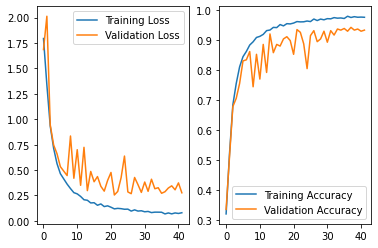

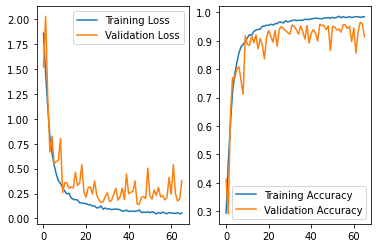

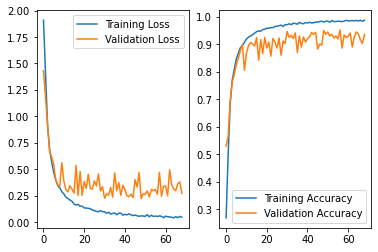

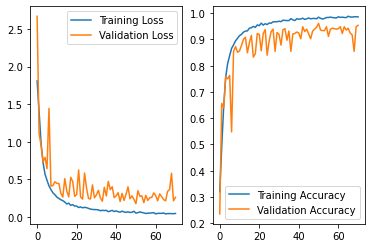

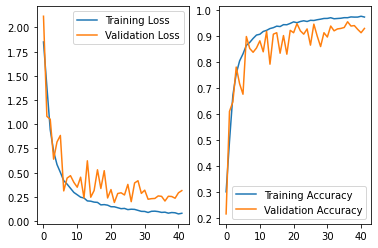

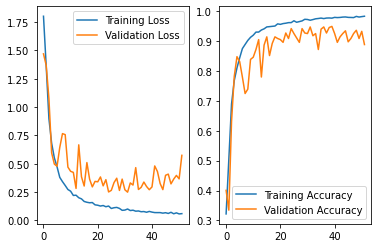

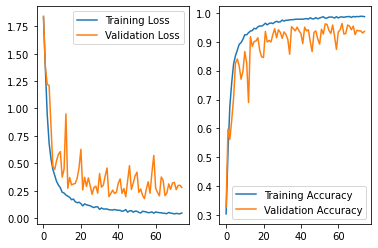

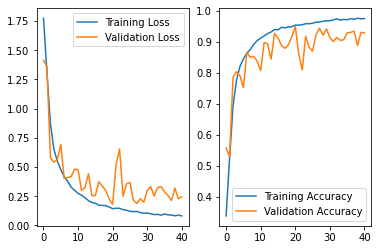

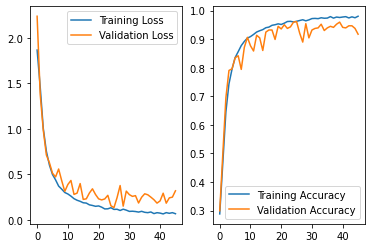

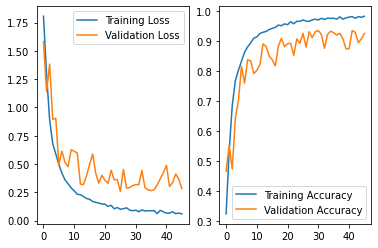

In [44]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [45]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.         0.         0.         0.         0.         0.
 0.04014552 0.        ]
precision sdev by class [0.         0.         0.         0.         0.         0.
 0.00097056 0.        ]
macro precision mean 0.005018189918813667
macro precision sdev 0.00012131998463870383
recall mean [0. 0. 0. 0. 0. 0. 1. 0.]
recall sdev [0. 0. 0. 0. 0. 0. 0. 0.]
macro recall mean 0.125
macro recall sdev 0.0
f1 mean [0.         0.         0.         0.         0.         0.
 0.07719045 0.        ]
f1 sdev [0.         0.         0.         0.         0.         0.
 0.00178978 0.        ]
macro f1 mean 0.009648806358936394
macro f1 sdev 0.00022372273111861336
accuracy mean 0.04009262722492354
accuracy sdev 0.000985952479607048


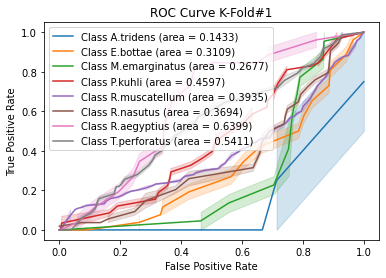

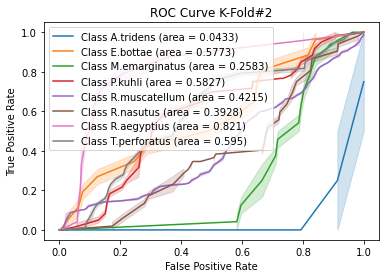

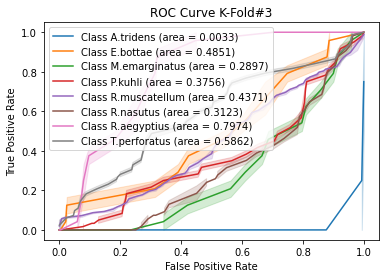

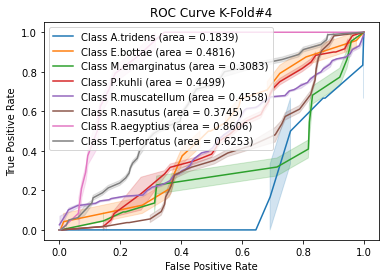

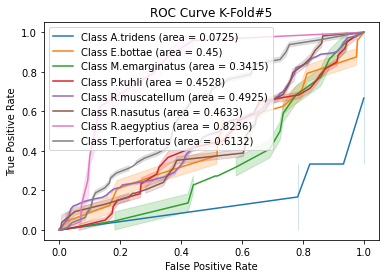

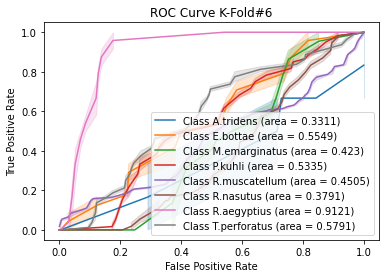

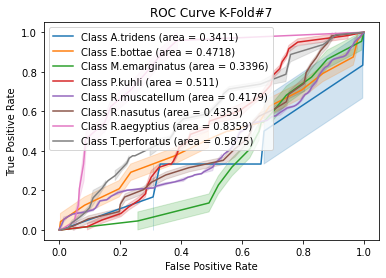

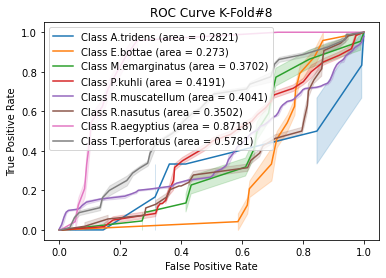

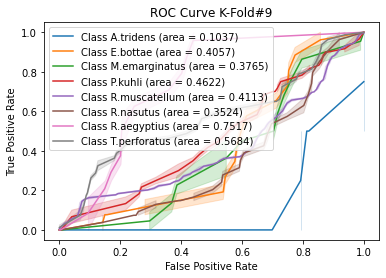

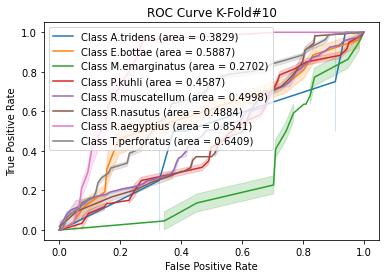

In [46]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [47]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.18873244147157192
Std  0.12972015183317898
Sp:  E.bottae
AUC Mean  0.4598979013121866
Std  0.10040660438474558
Sp:  M.emarginatus
AUC Mean  0.32449937519525146
Std  0.051989886228377434
Sp:  P.kuhli
AUC Mean  0.47052495217502266
Std  0.05559302094520949
Sp:  R.muscatellum
AUC Mean  0.4384106440634755
Std  0.034321717820503965
Sp:  R.nasutus
AUC Mean  0.3917780094477968
Std  0.051854426995203415
Sp:  R.aegyptius
AUC Mean  0.8168110714405905
Std  0.07194422525892953
Sp:  T.perforatus
AUC Mean  0.5914671989704892
Std  0.027418076311214172


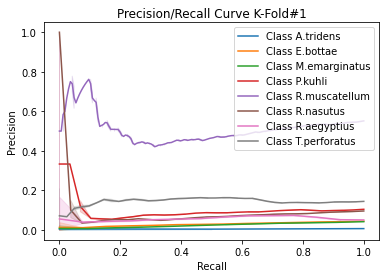

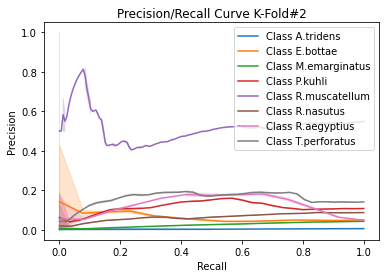

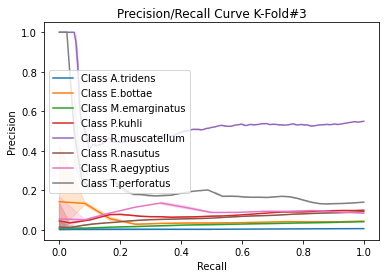

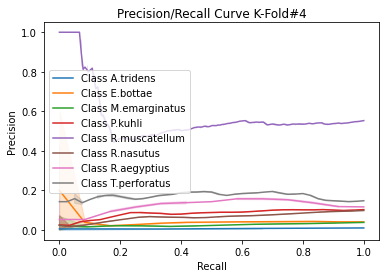

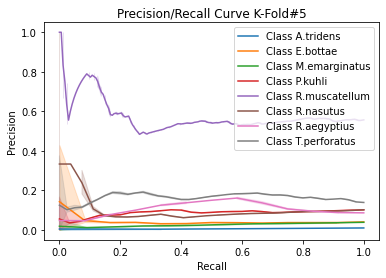

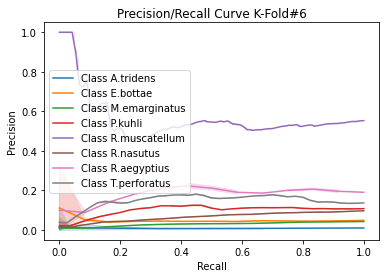

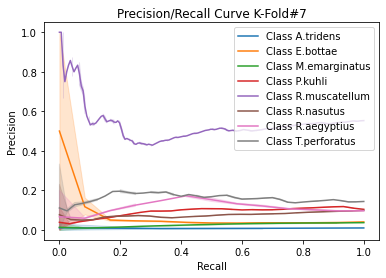

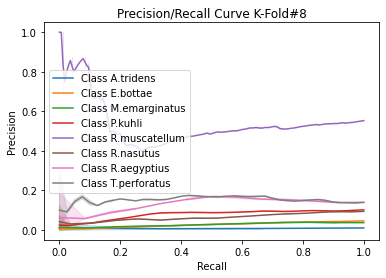

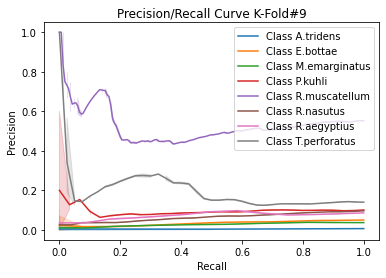

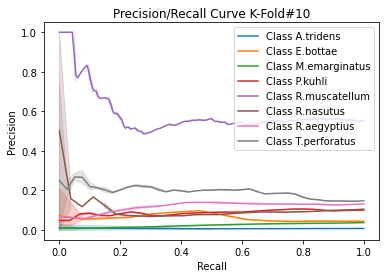

In [48]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  0   0   0   0   0   0   2   0]
 [  0   0   0   0   0   0  13   0]
 [  0   0   0   0   0   0  11   0]
 [  0   0   0   0   0   0  29   0]
 [  0   0   0   0   0   0 166   0]
 [  0   0   0   0   0   0  27   0]
 [  0   0   0   0   0   0  13   0]
 [  0   0   0   0   0   0  41   0]]


Confusion Matrix K-Fold #2

[[  0   0   0   0   0   0   2   0]
 [  0   0   0   0   0   0  13   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0  30   0]
 [  0   0   0   0   0   0 166   0]
 [  0   0   0   0   0   0  26   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0  41   0]]


Confusion Matrix K-Fold #3

[[  0   0   0   0   0   0   2   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0  30   0]
 [  0   0   0   1   0   0 165   0]
 [  0   0   0   0   0   0  27   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0  41   0]]


Confusion Matrix K-Fold #4

[[  0   0   0   0   0   0   3   0]
 [  

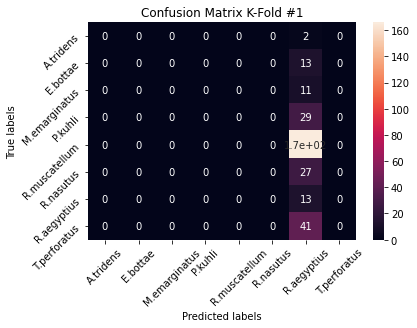

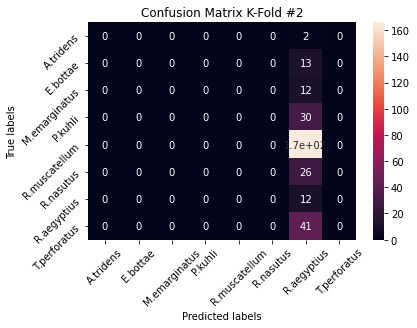

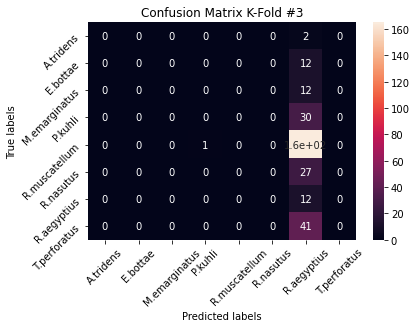

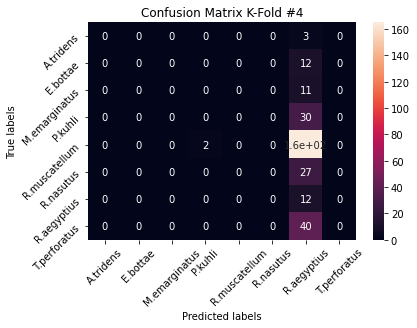

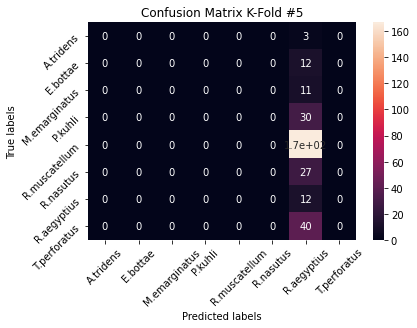

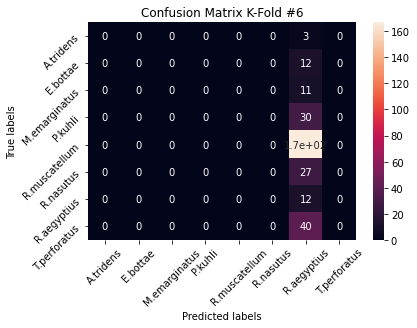

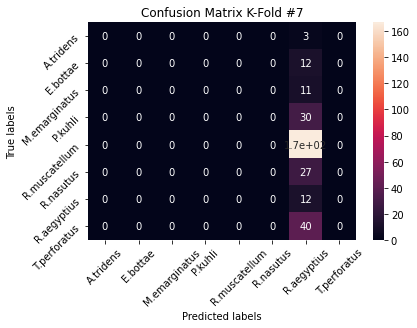

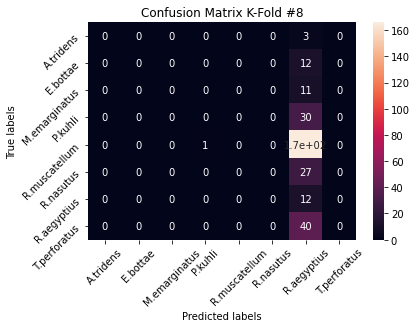

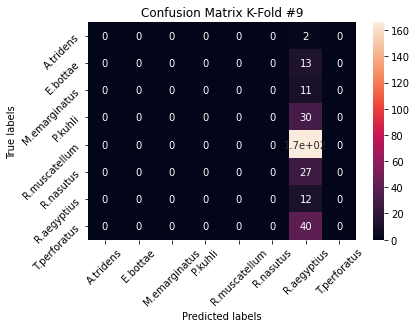

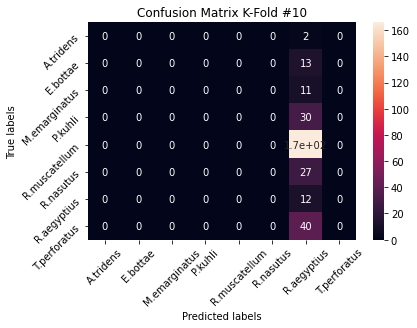

In [49]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[   0    0    0    0    0    0   25    0]
 [   0    0    0    0    0    0  124    0]
 [   0    0    0    0    0    0  112    0]
 [   0    0    0    0    0    0  299    0]
 [   0    0    0    4    0    0 1661    0]
 [   0    0    0    0    0    0  269    0]
 [   0    0    0    0    0    0  121    0]
 [   0    0    0    0    0    0  403    0]]

average of all confuion matrices
 [[  0   0   0   0   0   0   2   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0  11   0]
 [  0   0   0   0   0   0  29   0]
 [  0   0   0   0   0   0 166   0]
 [  0   0   0   0   0   0  26   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0  40   0]]


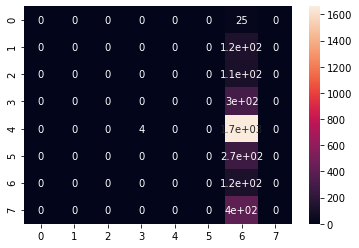

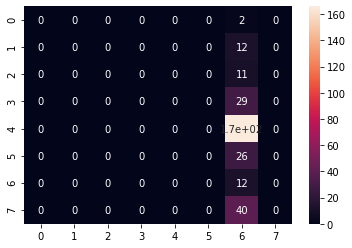

In [50]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]]


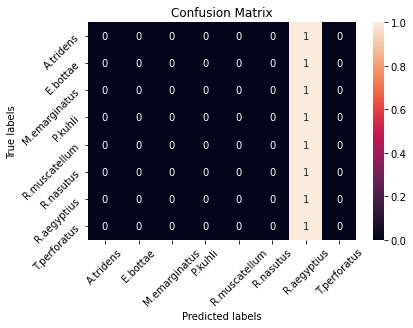

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V4 !!!!! K-Fold Training and Evaluation</h2>

In [8]:
folder = "models"
mode_version = "spec_smote_v4"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v4


In [9]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=160,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=112,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=80,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(256)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(448)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(352)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model



In [10]:
model = build_current_model()
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 160)       23680     
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 160)       640       
_________________________________________________________________
activation (Activation)      (None, 56, 85, 160)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 160)       0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 160)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 22, 112)       448112

In [11]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 9s - loss: 1.8433 - accuracy: 0.3285 - val_loss: 2.1464 - val_accuracy: 0.5515
Epoch 2/100
1199/1199 - 9s - loss: 1.3636 - accuracy: 0.5087 - val_loss: 1.1679 - val_accuracy: 0.5846
Epoch 3/100
1199/1199 - 9s - loss: 0.9058 - accuracy: 0.6839 - val_loss: 1.4150 - val_accuracy: 0.4577
Epoch 4/100
1199/1199 - 9s - loss: 0.6431 - accuracy: 0.7795 - val_loss: 0.8443 - val_accuracy: 0.6912
Epoch 5/100
1199/1199 - 9s - loss: 0.5316 - accuracy: 0.8157 - val_loss: 0.6523 - val_accuracy: 0.7941

Epoch 17/100
1199/1199 - 10s - loss: 0.1649 - accuracy: 0.9465 - val_loss: 0.6260 - val_accuracy: 0.8162
Epoch 18/100
1199/1199 - 10s - loss: 0.1453 - accuracy: 0.9501 - val_loss: 0.2514 - val_accuracy: 0.9191
Epoch 19/100
1199/1199 - 10s - loss: 0.1511 - accuracy: 0.9517 - val_loss: 0.4250 - val_accuracy: 0.8474
Epoch 20/100
1199/1199 - 9s - loss: 0.1394 - accuracy: 0.9553 - val_loss: 0.3180 - val_accuracy: 0.8971
Epoch 21/100
1199/1199 - 10s - loss: 0.1353 - accuracy: 0.9549 - val_loss: 0.2047 - val_accuracy: 0.9283
Epoch 22/100
1199/1199 - 10s - loss: 0.1236 - accuracy: 0.9618 - val_loss: 0.1859 - val_accuracy: 0.9485
Epoch 23/100
1199/1199 - 10s - loss: 0.1230 - accuracy: 0.9608 - val_loss: 0.2024 - val_accuracy: 0.9393
Epoch 24/100
1199/1199 - 10s - loss: 0.1132 - accuracy: 0.9635 - val_loss: 0.2113 - val_accuracy: 0.9283
Epoch 25/100
1199/1199 - 10s - loss: 0.1161 - accuracy: 0.9632 - val_loss: 0.2695 - val_accuracy: 0.9118
Epoch 26/100
1199/1199 - 10s - loss: 0.1053 - accuracy: 

Epoch 17/100
1199/1199 - 10s - loss: 0.1459 - accuracy: 0.9520 - val_loss: 0.5764 - val_accuracy: 0.8438
Epoch 18/100
1199/1199 - 10s - loss: 0.1468 - accuracy: 0.9531 - val_loss: 0.5971 - val_accuracy: 0.8309
Epoch 19/100
1199/1199 - 10s - loss: 0.1321 - accuracy: 0.9585 - val_loss: 0.3628 - val_accuracy: 0.8971
Epoch 20/100
1199/1199 - 10s - loss: 0.1345 - accuracy: 0.9577 - val_loss: 0.3484 - val_accuracy: 0.8915
Epoch 21/100
1199/1199 - 10s - loss: 0.1355 - accuracy: 0.9574 - val_loss: 0.5424 - val_accuracy: 0.8401
Epoch 22/100
1199/1199 - 10s - loss: 0.1280 - accuracy: 0.9590 - val_loss: 0.5571 - val_accuracy: 0.8456
Epoch 23/100
1199/1199 - 10s - loss: 0.1117 - accuracy: 0.9627 - val_loss: 0.6342 - val_accuracy: 0.8438
Epoch 24/100
1199/1199 - 10s - loss: 0.1055 - accuracy: 0.9675 - val_loss: 0.3531 - val_accuracy: 0.8952
Epoch 25/100
1199/1199 - 10s - loss: 0.1079 - accuracy: 0.9652 - val_loss: 0.3479 - val_accuracy: 0.9062
Epoch 26/100
1199/1199 - 10s - loss: 0.1044 - accuracy:

Epoch 3/100
1198/1198 - 9s - loss: 0.8253 - accuracy: 0.7093 - val_loss: 0.8704 - val_accuracy: 0.7004
Epoch 4/100
1198/1198 - 9s - loss: 0.6340 - accuracy: 0.7848 - val_loss: 0.8427 - val_accuracy: 0.7114
Epoch 5/100
1198/1198 - 9s - loss: 0.5231 - accuracy: 0.8228 - val_loss: 1.8619 - val_accuracy: 0.4798
Epoch 6/100
1198/1198 - 10s - loss: 0.4190 - accuracy: 0.8601 - val_loss: 0.4393 - val_accuracy: 0.8438
Epoch 7/100
1198/1198 - 10s - loss: 0.3561 - accuracy: 0.8814 - val_loss: 0.3395 - val_accuracy: 0.8934
Epoch 8/100
1198/1198 - 10s - loss: 0.3283 - accuracy: 0.8945 - val_loss: 0.8031 - val_accuracy: 0.7629
Epoch 9/100
1198/1198 - 10s - loss: 0.2793 - accuracy: 0.9079 - val_loss: 0.5555 - val_accuracy: 0.8346
Epoch 10/100
1198/1198 - 10s - loss: 0.2544 - accuracy: 0.9170 - val_loss: 0.3114 - val_accuracy: 0.9099
Epoch 11/100
1198/1198 - 10s - loss: 0.2332 - accuracy: 0.9235 - val_loss: 0.3650 - val_accuracy: 0.8879
Epoch 12/100
1198/1198 - 10s - loss: 0.2215 - accuracy: 0.9296 - 

Epoch 19/100
1198/1198 - 10s - loss: 0.1449 - accuracy: 0.9546 - val_loss: 0.3704 - val_accuracy: 0.8824
Epoch 20/100
1198/1198 - 10s - loss: 0.1379 - accuracy: 0.9545 - val_loss: 0.3295 - val_accuracy: 0.9044
Epoch 21/100
1198/1198 - 10s - loss: 0.1211 - accuracy: 0.9625 - val_loss: 0.3051 - val_accuracy: 0.9265
Epoch 22/100
1198/1198 - 10s - loss: 0.1254 - accuracy: 0.9594 - val_loss: 0.2832 - val_accuracy: 0.9283
Epoch 23/100
1198/1198 - 10s - loss: 0.1252 - accuracy: 0.9601 - val_loss: 0.3286 - val_accuracy: 0.9118
Epoch 24/100
1198/1198 - 10s - loss: 0.1182 - accuracy: 0.9649 - val_loss: 0.3758 - val_accuracy: 0.9191
Epoch 25/100
1198/1198 - 10s - loss: 0.1123 - accuracy: 0.9652 - val_loss: 0.3427 - val_accuracy: 0.9099
Epoch 26/100
1198/1198 - 10s - loss: 0.1049 - accuracy: 0.9663 - val_loss: 0.3359 - val_accuracy: 0.9173
Epoch 27/100
1198/1198 - 10s - loss: 0.0967 - accuracy: 0.9715 - val_loss: 0.3026 - val_accuracy: 0.9338
Epoch 28/100
1198/1198 - 10s - loss: 0.1028 - accuracy:

Epoch 40/100
1198/1198 - 10s - loss: 0.0746 - accuracy: 0.9785 - val_loss: 0.2745 - val_accuracy: 0.9430
Epoch 41/100
1198/1198 - 10s - loss: 0.0610 - accuracy: 0.9800 - val_loss: 0.3058 - val_accuracy: 0.9173
Epoch 42/100
1198/1198 - 10s - loss: 0.0529 - accuracy: 0.9835 - val_loss: 0.4130 - val_accuracy: 0.9081
Epoch 43/100
1198/1198 - 10s - loss: 0.0661 - accuracy: 0.9798 - val_loss: 0.3205 - val_accuracy: 0.9320
Epoch 44/100
1198/1198 - 10s - loss: 0.0628 - accuracy: 0.9806 - val_loss: 0.4413 - val_accuracy: 0.9136
Epoch 45/100
1198/1198 - 10s - loss: 0.0730 - accuracy: 0.9768 - val_loss: 0.3302 - val_accuracy: 0.9375
Epoch 46/100
1198/1198 - 10s - loss: 0.0518 - accuracy: 0.9826 - val_loss: 0.3287 - val_accuracy: 0.9485
Epoch 47/100
1198/1198 - 10s - loss: 0.0637 - accuracy: 0.9817 - val_loss: 0.3085 - val_accuracy: 0.9210
Epoch 48/100
1198/1198 - 9s - loss: 0.0521 - accuracy: 0.9842 - val_loss: 0.3794 - val_accuracy: 0.9504
Epoch 49/100
1198/1198 - 10s - loss: 0.0539 - accuracy: 

Epoch 37/100
1198/1198 - 10s - loss: 0.0964 - accuracy: 0.9712 - val_loss: 0.3063 - val_accuracy: 0.9136
Epoch 38/100
1198/1198 - 10s - loss: 0.0805 - accuracy: 0.9753 - val_loss: 0.2085 - val_accuracy: 0.9338
Epoch 39/100
1198/1198 - 10s - loss: 0.0752 - accuracy: 0.9770 - val_loss: 0.3184 - val_accuracy: 0.9191
Epoch 40/100
1198/1198 - 10s - loss: 0.0697 - accuracy: 0.9776 - val_loss: 0.4278 - val_accuracy: 0.8842
Epoch 41/100
1198/1198 - 10s - loss: 0.0776 - accuracy: 0.9790 - val_loss: 0.2348 - val_accuracy: 0.9338
Epoch 42/100
1198/1198 - 10s - loss: 0.0660 - accuracy: 0.9800 - val_loss: 0.2285 - val_accuracy: 0.9504
Epoch 43/100
1198/1198 - 10s - loss: 0.0711 - accuracy: 0.9776 - val_loss: 0.2228 - val_accuracy: 0.9522
Epoch 44/100
1198/1198 - 10s - loss: 0.0829 - accuracy: 0.9750 - val_loss: 0.2669 - val_accuracy: 0.9118
Epoch 45/100
1198/1198 - 10s - loss: 0.0597 - accuracy: 0.9814 - val_loss: 0.2230 - val_accuracy: 0.9449
Epoch 46/100
1198/1198 - 10s - loss: 0.0591 - accuracy:

Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 9s - loss: 1.8856 - accuracy: 0.3159 - val_loss: 1.5398 - val_accuracy: 0.3713
Epoch 2/100
1199/1199 - 9s - loss: 1.3419 - accuracy: 0.5167 - val_loss: 1.1323 - val_accuracy: 0.6342
Epoch 3/100
1199/1199 - 9s - loss: 0.9370 - accuracy: 0.6686 - val_loss: 0.9154 - val_accuracy: 0.6654
Epoch 4/100
1199/1199 - 9s - loss: 0.6969 - accuracy: 0.7614 - val_loss: 1.3736 - val_accuracy: 0.4890
Epoch 5/100
1199/1199 - 10s - loss: 0.5457 - accuracy: 0.8145 - val_loss: 0.5999 - val_accuracy: 0.777

# Load and eval

In [14]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8

In [15]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 87), ('T.perforatus', 290), ('P.kuhli', 215), ('A.tridens', 18), ('M.emarginatus', 80)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 289), ('R.muscatellum', 1199), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('M.emarginatus', 80), ('R.nasutus', 194), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('E.bottae', 1199), ('R.aegyptius', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.nasutus', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


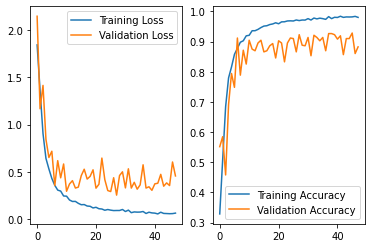

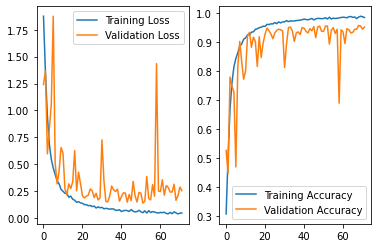

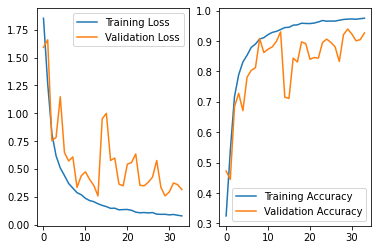

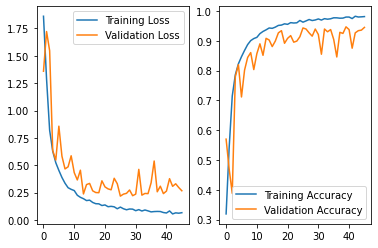

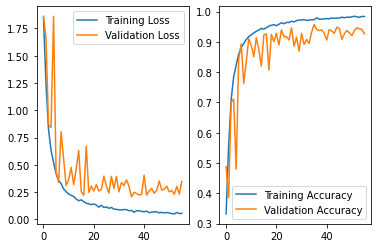

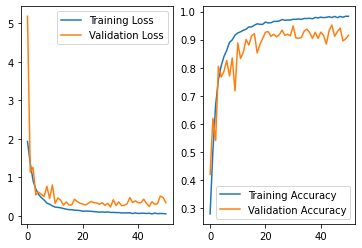

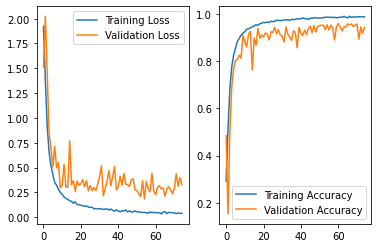

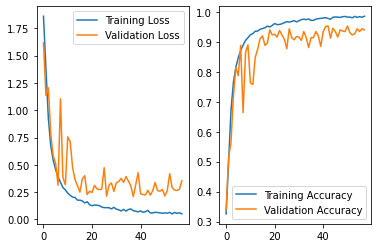

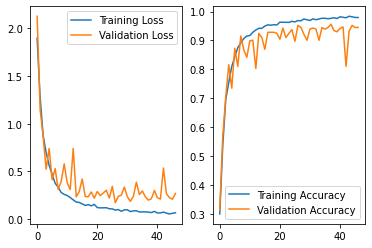

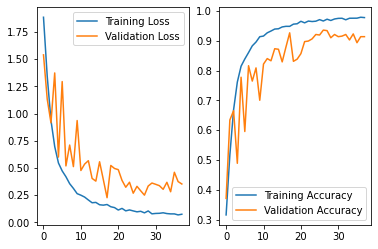

In [16]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [17]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.         0.         0.03711029 0.         0.         0.
 0.         0.        ]
precision sdev by class [0.         0.         0.00131324 0.         0.         0.
 0.         0.        ]
macro precision mean 0.004638786825372379
macro precision sdev 0.00016415486526430708
recall mean [0. 0. 1. 0. 0. 0. 0. 0.]
recall sdev [0. 0. 0. 0. 0. 0. 0. 0.]
macro recall mean 0.125
macro recall sdev 0.0
f1 mean [0.         0.         0.07156171 0.         0.         0.
 0.         0.        ]
f1 sdev [0.         0.         0.00243727 0.         0.         0.
 0.         0.        ]
macro f1 mean 0.008945214033505887
macro f1 sdev 0.0003046583256728926
accuracy mean 0.03711029460297903
accuracy sdev 0.0013132389221144566


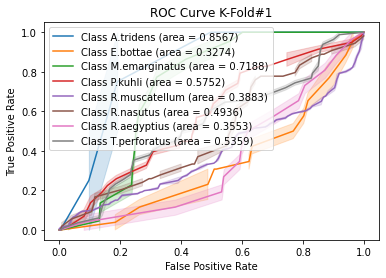

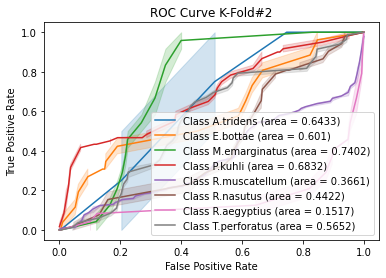

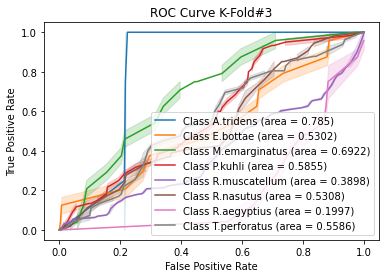

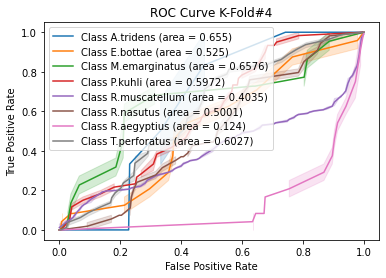

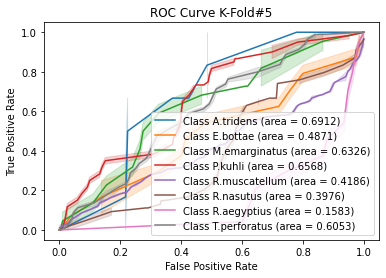

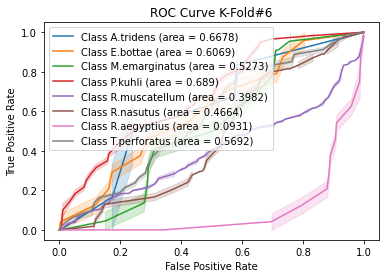

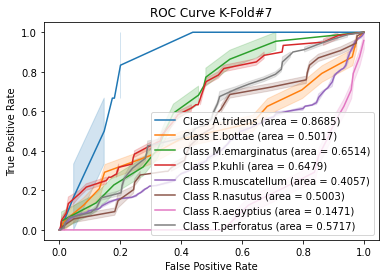

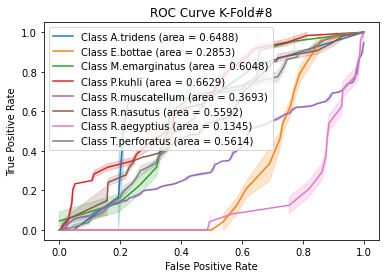

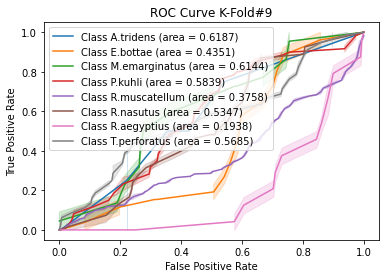

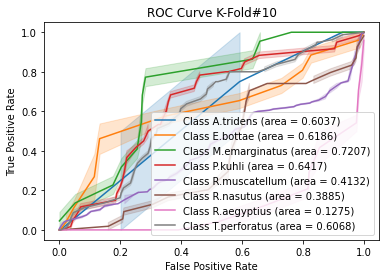

In [18]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [19]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.7038623188405797
Std  0.09211523259858094
Sp:  E.bottae
AUC Mean  0.49182931133914015
Std  0.10808127614773569
Sp:  M.emarginatus
AUC Mean  0.6560145805728814
Std  0.06165734387584946
Sp:  P.kuhli
AUC Mean  0.6323288005777545
Std  0.04087546690981367
Sp:  R.muscatellum
AUC Mean  0.3928434000374713
Std  0.017262467000871216
Sp:  R.nasutus
AUC Mean  0.4813269373585147
Std  0.05441268139988818
Sp:  R.aegyptius
AUC Mean  0.16850363230016613
Std  0.06918818864604687
Sp:  T.perforatus
AUC Mean  0.5745249690404907
Std  0.02204499604727649


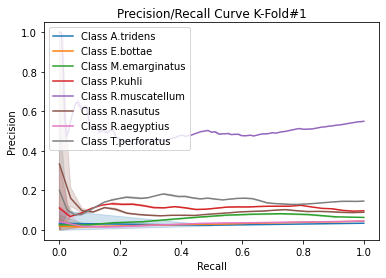

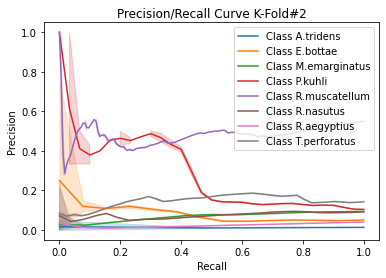

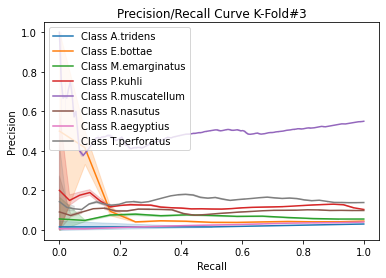

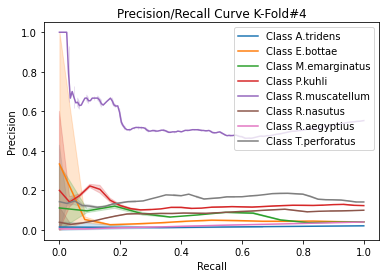

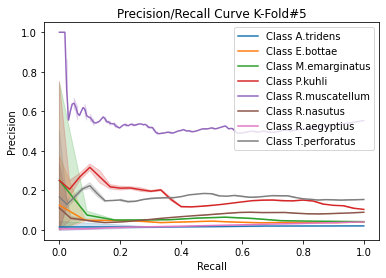

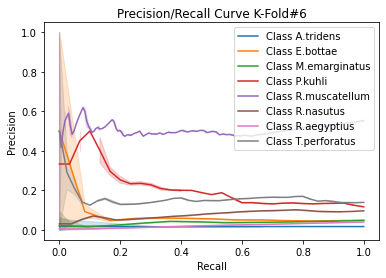

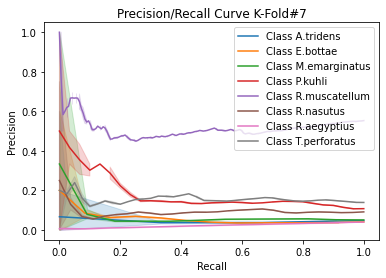

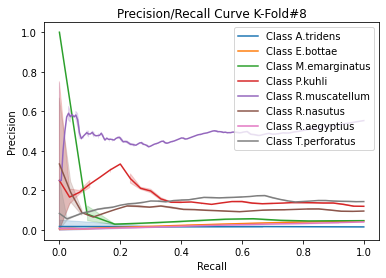

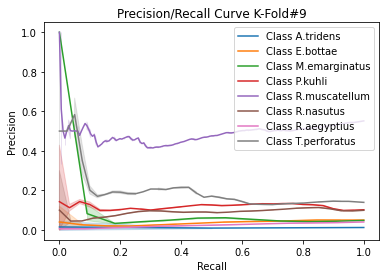

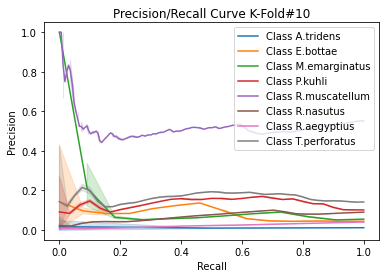

In [20]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  0   0   2   0   0   0   0   0]
 [  0   0  13   0   0   0   0   0]
 [  0   0  11   0   0   0   0   0]
 [  0   0  29   0   0   0   0   0]
 [  0   0 166   0   0   0   0   0]
 [  0   0  27   0   0   0   0   0]
 [  0   0  13   0   0   0   0   0]
 [  0   0  41   0   0   0   0   0]]


Confusion Matrix K-Fold #2

[[  0   0   2   0   0   0   0   0]
 [  0   0  13   0   0   0   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0  30   0   0   0   0   0]
 [  0   0 166   0   0   0   0   0]
 [  0   0  26   0   0   0   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0  41   0   0   0   0   0]]


Confusion Matrix K-Fold #3

[[  0   0   2   0   0   0   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0  30   0   0   0   0   0]
 [  0   0 166   0   0   0   0   0]
 [  0   0  27   0   0   0   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0  41   0   0   0   0   0]]


Confusion Matrix K-Fold #4

[[  0   0   3   0   0   0   0   0]
 [  

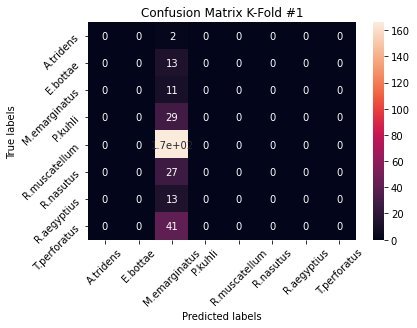

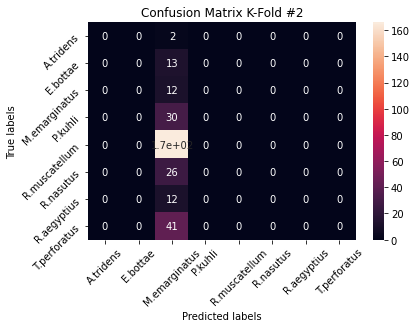

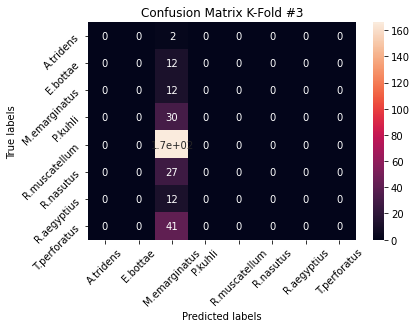

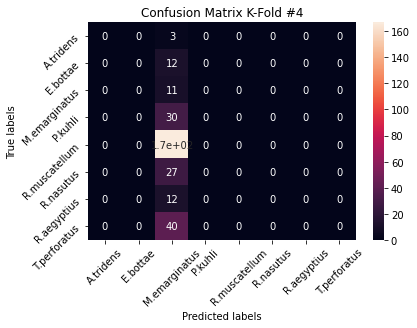

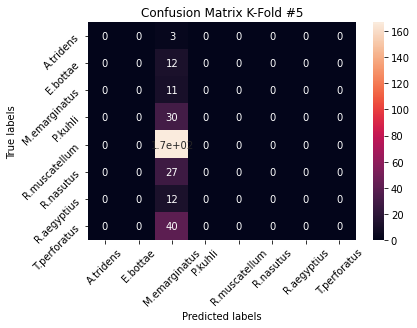

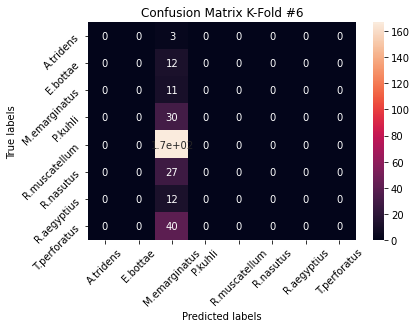

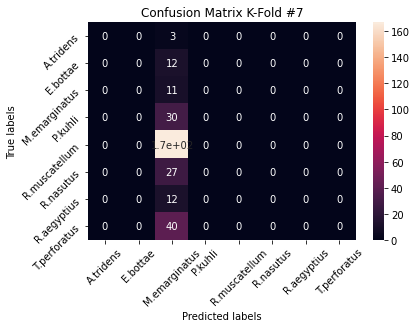

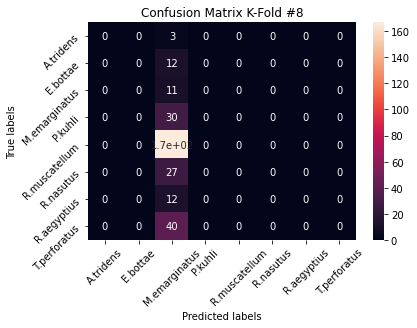

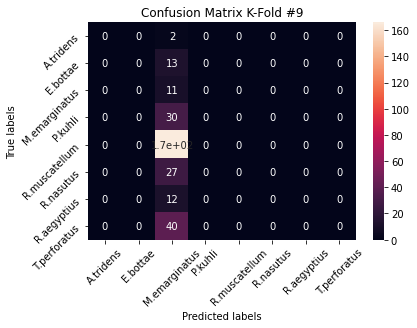

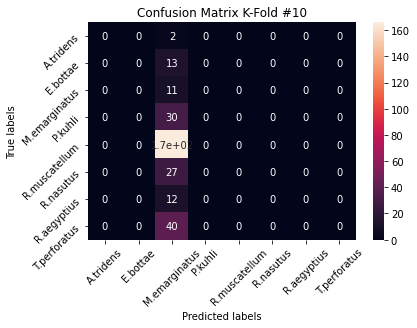

In [21]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[   0    0   25    0    0    0    0    0]
 [   0    0  124    0    0    0    0    0]
 [   0    0  112    0    0    0    0    0]
 [   0    0  299    0    0    0    0    0]
 [   0    0 1665    0    0    0    0    0]
 [   0    0  269    0    0    0    0    0]
 [   0    0  121    0    0    0    0    0]
 [   0    0  403    0    0    0    0    0]]

average of all confuion matrices
 [[  0   0   2   0   0   0   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0  11   0   0   0   0   0]
 [  0   0  29   0   0   0   0   0]
 [  0   0 166   0   0   0   0   0]
 [  0   0  26   0   0   0   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0  40   0   0   0   0   0]]


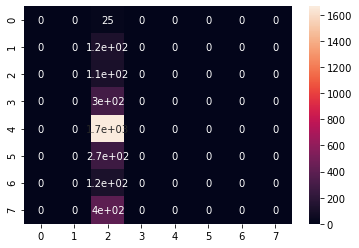

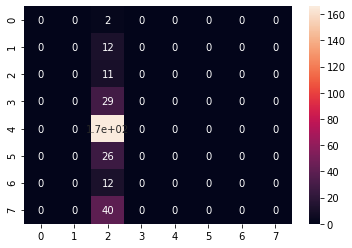

In [22]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]]


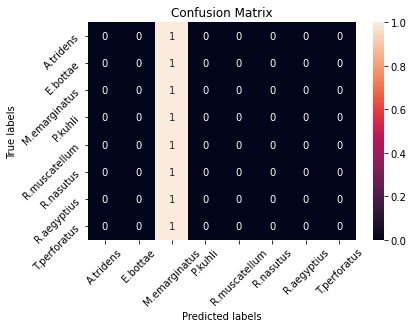

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V5 !!!!! K-Fold Training and Evaluation</h2>

In [24]:
folder = "models"
mode_version = "spec_smote_v5"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v5


In [25]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=48,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=32,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=48,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=128,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(112)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(32)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [26]:
model = build_current_model()
model.summary()

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 56, 85, 48)        7104      
_________________________________________________________________
batch_normalization_77 (Batc (None, 56, 85, 48)        192       
_________________________________________________________________
activation_77 (Activation)   (None, 56, 85, 48)        0         
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 28, 43, 48)        0         
_________________________________________________________________
spatial_dropout2d_44 (Spatia (None, 28, 43, 48)        0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 14, 22, 32)        384

In [27]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 5s - loss: 1.8170 - accuracy: 0.3085 - val_loss: 1.5379 - val_accuracy: 0.5717
Epoch 2/100
1199/1199 - 6s - loss: 1.2814 - accuracy: 0.5377 - val_loss: 1.4692 - val_accuracy: 0.4118
Epoch 3/100
1199/1199 - 6s - loss: 0.8392 - accuracy: 0.7058 - val_loss: 0.6977 - val_accuracy: 0.7610
Epoch 4/100
1199/1199 - 5s - loss: 0.6263 - accuracy: 0.7844 - val_loss: 0.6512 - val_accuracy: 0.7629
Epoch 5/100
1199/1199 - 5s - loss: 0.5157 - accuracy: 0.8282 - val_loss: 0.7077 - val_accuracy: 0.7335

Epoch 20/100
1199/1199 - 5s - loss: 0.1507 - accuracy: 0.9509 - val_loss: 0.2472 - val_accuracy: 0.9357
Epoch 21/100
1199/1199 - 5s - loss: 0.1557 - accuracy: 0.9506 - val_loss: 0.2139 - val_accuracy: 0.9357
Epoch 22/100
1199/1199 - 4s - loss: 0.1386 - accuracy: 0.9543 - val_loss: 0.2271 - val_accuracy: 0.9265
Epoch 23/100
1199/1199 - 4s - loss: 0.1507 - accuracy: 0.9515 - val_loss: 0.2004 - val_accuracy: 0.9449
Epoch 24/100
1199/1199 - 5s - loss: 0.1360 - accuracy: 0.9549 - val_loss: 0.1828 - val_accuracy: 0.9504
Epoch 25/100
1199/1199 - 5s - loss: 0.1276 - accuracy: 0.9580 - val_loss: 0.2015 - val_accuracy: 0.9485
Epoch 26/100
1199/1199 - 5s - loss: 0.1253 - accuracy: 0.9608 - val_loss: 0.2071 - val_accuracy: 0.9338
Epoch 27/100
1199/1199 - 6s - loss: 0.1187 - accuracy: 0.9622 - val_loss: 0.3460 - val_accuracy: 0.8915
Epoch 28/100
1199/1199 - 5s - loss: 0.1200 - accuracy: 0.9595 - val_loss: 0.2463 - val_accuracy: 0.9265
Epoch 29/100
1199/1199 - 5s - loss: 0.1211 - accuracy: 0.9607 - 

Epoch 39/100
1199/1199 - 5s - loss: 0.0924 - accuracy: 0.9684 - val_loss: 0.2403 - val_accuracy: 0.9375
Epoch 40/100
1199/1199 - 5s - loss: 0.0967 - accuracy: 0.9701 - val_loss: 0.2330 - val_accuracy: 0.9320
Epoch 41/100
1199/1199 - 5s - loss: 0.0958 - accuracy: 0.9700 - val_loss: 0.3491 - val_accuracy: 0.8934
Epoch 42/100
1199/1199 - 5s - loss: 0.0910 - accuracy: 0.9699 - val_loss: 0.2636 - val_accuracy: 0.9228
Epoch 43/100
1199/1199 - 5s - loss: 0.0885 - accuracy: 0.9721 - val_loss: 0.3041 - val_accuracy: 0.9191
Epoch 44/100
1199/1199 - 5s - loss: 0.0865 - accuracy: 0.9724 - val_loss: 0.2662 - val_accuracy: 0.9320
Epoch 45/100
1199/1199 - 5s - loss: 0.0863 - accuracy: 0.9730 - val_loss: 0.2169 - val_accuracy: 0.9449
Epoch 46/100
1199/1199 - 5s - loss: 0.0867 - accuracy: 0.9733 - val_loss: 0.5396 - val_accuracy: 0.8456
Epoch 47/100
1199/1199 - 5s - loss: 0.0959 - accuracy: 0.9696 - val_loss: 0.3120 - val_accuracy: 0.9246
Epoch 48/100
1199/1199 - 6s - loss: 0.0803 - accuracy: 0.9740 - 

Epoch 36/100
1198/1198 - 5s - loss: 0.0932 - accuracy: 0.9708 - val_loss: 0.3229 - val_accuracy: 0.9173
Epoch 37/100
1198/1198 - 5s - loss: 0.0962 - accuracy: 0.9688 - val_loss: 0.3471 - val_accuracy: 0.9210
Epoch 38/100
1198/1198 - 5s - loss: 0.0937 - accuracy: 0.9711 - val_loss: 0.2703 - val_accuracy: 0.9430
Epoch 39/100
Restoring model weights from the end of the best epoch.
1198/1198 - 5s - loss: 0.0922 - accuracy: 0.9698 - val_loss: 0.2850 - val_accuracy: 0.9301
Epoch 00039: early stopping
models/spec_smote_v5_iter_4.model
INFO:tensorflow:Assets written to: models/spec_smote_v5_iter_4.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.trid

Epoch 23/100
1198/1198 - 5s - loss: 0.1476 - accuracy: 0.9513 - val_loss: 0.2883 - val_accuracy: 0.9320
Epoch 24/100
1198/1198 - 6s - loss: 0.1359 - accuracy: 0.9585 - val_loss: 0.2707 - val_accuracy: 0.9320
Epoch 25/100
1198/1198 - 5s - loss: 0.1368 - accuracy: 0.9574 - val_loss: 0.3028 - val_accuracy: 0.9393
Epoch 26/100
1198/1198 - 5s - loss: 0.1271 - accuracy: 0.9597 - val_loss: 0.4918 - val_accuracy: 0.8713
Epoch 27/100
1198/1198 - 4s - loss: 0.1217 - accuracy: 0.9620 - val_loss: 0.3399 - val_accuracy: 0.9173
Epoch 28/100
1198/1198 - 5s - loss: 0.1212 - accuracy: 0.9602 - val_loss: 0.2960 - val_accuracy: 0.9191
Epoch 29/100
1198/1198 - 4s - loss: 0.1159 - accuracy: 0.9648 - val_loss: 0.3602 - val_accuracy: 0.9081
Epoch 30/100
1198/1198 - 5s - loss: 0.1233 - accuracy: 0.9623 - val_loss: 0.2949 - val_accuracy: 0.9320
Epoch 31/100
1198/1198 - 6s - loss: 0.1072 - accuracy: 0.9669 - val_loss: 0.3188 - val_accuracy: 0.9154
Epoch 32/100
1198/1198 - 6s - loss: 0.1085 - accuracy: 0.9664 - 

Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 5s - loss: 1.7533 - accuracy: 0.3404 - val_loss: 1.4904 - val_accuracy: 0.3897
Epoch 2/100
1198/1198 - 5s - loss: 1.2761 - accuracy: 0.5375 - val_loss: 1.3782 - val_accuracy: 0.5147
Epoch 3/100
1198/1198 - 5s - loss: 0.9111 - accuracy: 0.6805 - val_loss: 0.9523 - val_accuracy: 0.6489
Epoch 4/100
1198/1198 - 5s - loss: 0.6930 - accuracy: 0.7591 - val_loss: 0.8927 - val_accuracy: 0.6783
Epoch 5/100
1198/1198 - 4s - loss: 0.5743 - accuracy: 0.8015 - val_loss: 1.5586 - val_accuracy: 0.4982
Epoch 6/100
1198/1198 - 6s - loss: 0.4995 - accuracy: 0.8288 - val_loss: 0.3869 - val_accuracy: 0.8566
Epoch 7/100
1198/1198 - 5s - loss: 0.4374 - accuracy: 0.8526 - val_loss: 0.4451 - val_accuracy: 0.8290
Epoch 8/100
1198/1198 - 5s - loss: 0.3992 - accuracy: 0.8679 - val_loss: 0.7422 - val_accuracy: 0.7757
Epoch 9/100
1198/1198 - 5s - loss: 0.3463 - accuracy: 0.8805 - val_loss: 0.3210 - val_accuracy: 0.8787
Epoch 10/100
1198/1198 - 5s - loss: 0.3309 - a

Epoch 15/100
1199/1199 - 5s - loss: 0.2141 - accuracy: 0.9280 - val_loss: 0.3685 - val_accuracy: 0.8585
Epoch 16/100
1199/1199 - 5s - loss: 0.2077 - accuracy: 0.9291 - val_loss: 0.2367 - val_accuracy: 0.9338
Epoch 17/100
1199/1199 - 5s - loss: 0.1958 - accuracy: 0.9324 - val_loss: 0.2829 - val_accuracy: 0.9099
Epoch 18/100
1199/1199 - 5s - loss: 0.1909 - accuracy: 0.9396 - val_loss: 0.2766 - val_accuracy: 0.9154
Epoch 19/100
1199/1199 - 5s - loss: 0.1741 - accuracy: 0.9425 - val_loss: 0.2605 - val_accuracy: 0.9338
Epoch 20/100
1199/1199 - 5s - loss: 0.1731 - accuracy: 0.9459 - val_loss: 0.2214 - val_accuracy: 0.9485
Epoch 21/100
1199/1199 - 5s - loss: 0.1686 - accuracy: 0.9453 - val_loss: 0.2298 - val_accuracy: 0.9412
Epoch 22/100
1199/1199 - 5s - loss: 0.1495 - accuracy: 0.9496 - val_loss: 0.2804 - val_accuracy: 0.9191
Epoch 23/100
1199/1199 - 5s - loss: 0.1436 - accuracy: 0.9537 - val_loss: 0.4114 - val_accuracy: 0.8860
Epoch 24/100
1199/1199 - 6s - loss: 0.1546 - accuracy: 0.9509 - 

Epoch 6/100
1199/1199 - 5s - loss: 0.4520 - accuracy: 0.8487 - val_loss: 0.8365 - val_accuracy: 0.7132
Epoch 7/100
1199/1199 - 5s - loss: 0.4029 - accuracy: 0.8633 - val_loss: 0.6540 - val_accuracy: 0.7684
Epoch 8/100
1199/1199 - 5s - loss: 0.3674 - accuracy: 0.8767 - val_loss: 0.5280 - val_accuracy: 0.8162
Epoch 9/100
1199/1199 - 5s - loss: 0.3258 - accuracy: 0.8891 - val_loss: 0.5362 - val_accuracy: 0.8162
Epoch 10/100
1199/1199 - 6s - loss: 0.3003 - accuracy: 0.9002 - val_loss: 0.4262 - val_accuracy: 0.8621
Epoch 11/100
1199/1199 - 5s - loss: 0.2777 - accuracy: 0.9112 - val_loss: 0.3573 - val_accuracy: 0.8713
Epoch 12/100
1199/1199 - 4s - loss: 0.2471 - accuracy: 0.9187 - val_loss: 0.5126 - val_accuracy: 0.8419
Epoch 13/100
1199/1199 - 6s - loss: 0.2293 - accuracy: 0.9243 - val_loss: 0.7331 - val_accuracy: 0.7445
Epoch 14/100
1199/1199 - 4s - loss: 0.2207 - accuracy: 0.9281 - val_loss: 0.4585 - val_accuracy: 0.8566
Epoch 15/100
1199/1199 - 5s - loss: 0.2126 - accuracy: 0.9313 - val_

# LOAD AND EVAL

In [28]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [29]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 87), ('T.perforatus', 290), ('P.kuhli', 215), ('A.tridens', 18), ('M.emarginatus', 80)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 289), ('R.muscatellum', 1199), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('M.emarginatus', 80), ('R.nasutus', 194), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('E.bottae', 1199), ('R.aegyptius', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.nasutus', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


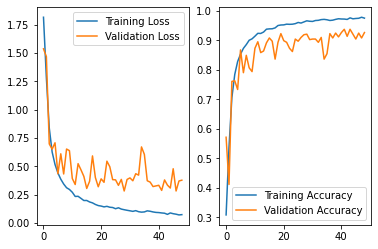

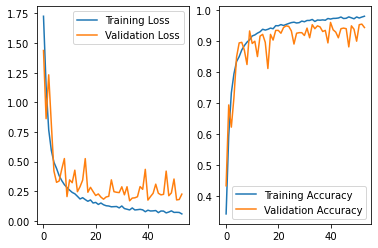

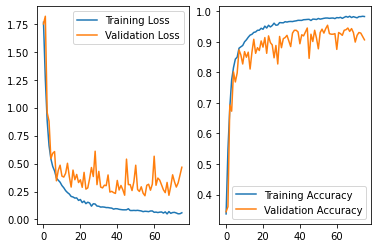

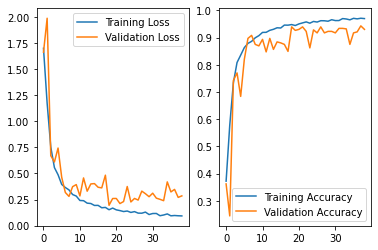

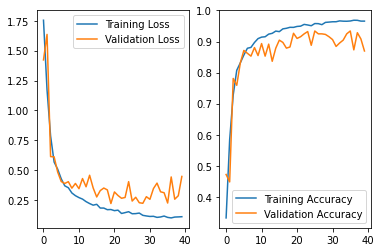

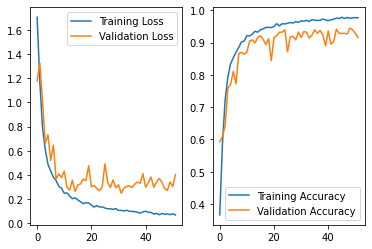

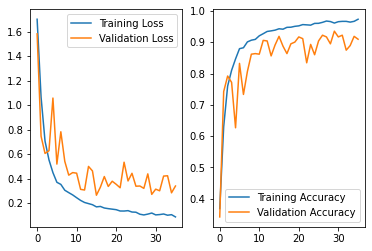

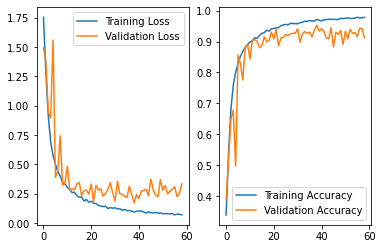

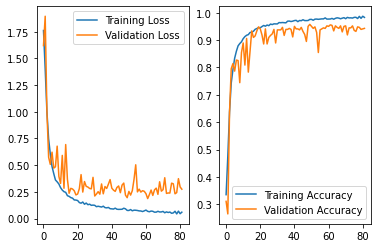

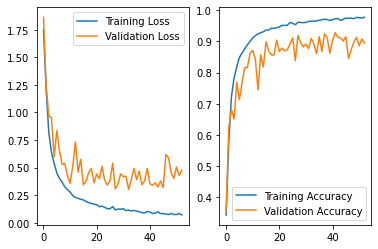

In [30]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [31]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.         0.04388889 0.         0.         0.         0.09079172
 0.         0.        ]
precision sdev by class [0.         0.04766407 0.         0.         0.         0.00284137
 0.         0.        ]
macro precision mean 0.016835076398604022
macro precision sdev 0.005926118868824583
recall mean [0.         0.05705128 0.         0.         0.         0.96666667
 0.         0.        ]
recall sdev [0.         0.06464196 0.         0.         0.         0.03076527
 0.         0.        ]
macro recall mean 0.1279647435897436
macro recall sdev 0.007989445368241026
f1 mean [0.         0.04912838 0.         0.         0.         0.16598986
 0.         0.        ]
f1 sdev [0.         0.05394258 0.         0.         0.         0.00515051
 0.         0.        ]
macro f1 mean 0.026889780666461877
macro f1 sdev 0.006703552082273471
accuracy mean 0.08847000066005148
accuracy sdev 0.00334974755285899


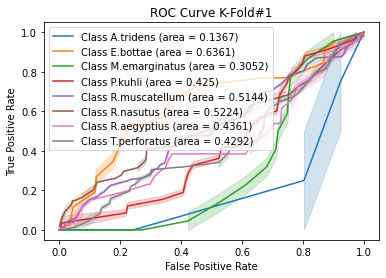

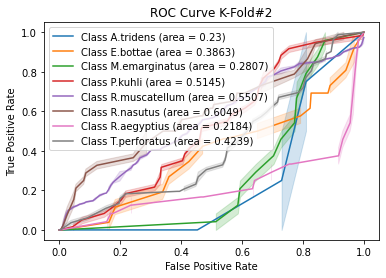

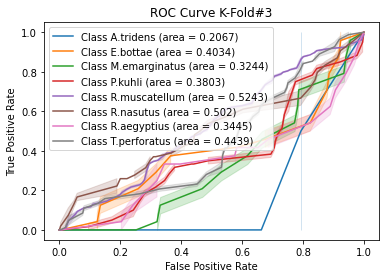

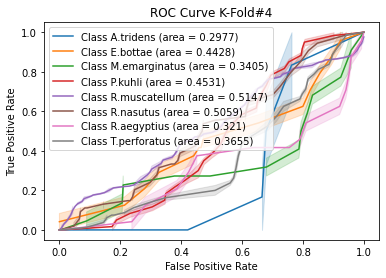

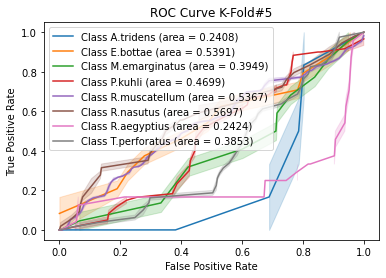

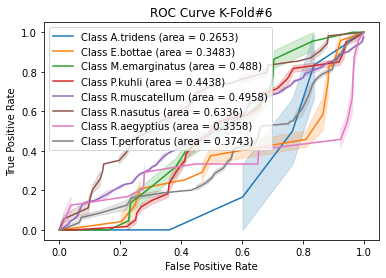

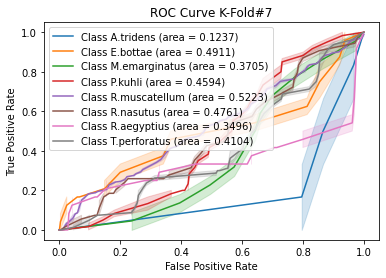

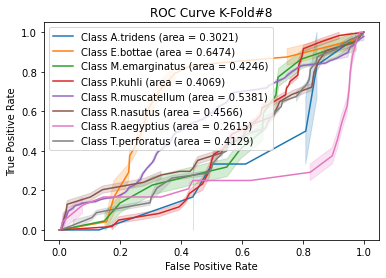

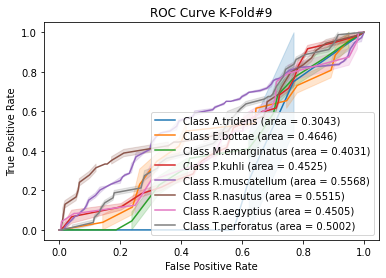

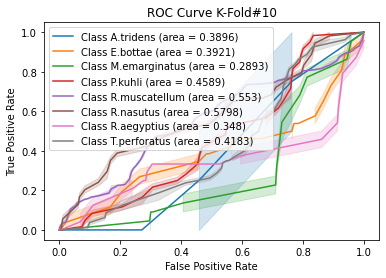

In [32]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [33]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.24969676700111482
Std  0.07669385147252146
Sp:  E.bottae
AUC Mean  0.47513218460916373
Std  0.09854695434419151
Sp:  M.emarginatus
AUC Mean  0.36212977625526505
Std  0.06293347647533888
Sp:  P.kuhli
AUC Mean  0.44641680474763135
Std  0.034635706498516876
Sp:  R.muscatellum
AUC Mean  0.5306877158353581
Std  0.018761550364809525
Sp:  R.nasutus
AUC Mean  0.5402310409508918
Std  0.05433888177422164
Sp:  R.aegyptius
AUC Mean  0.3307838509877348
Std  0.07186620675386927
Sp:  T.perforatus
AUC Mean  0.4163893935859601
Std  0.03658214318677979


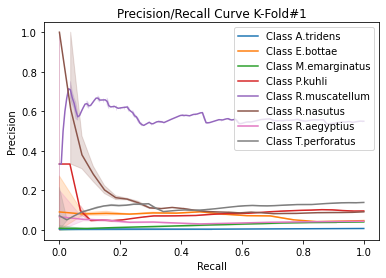

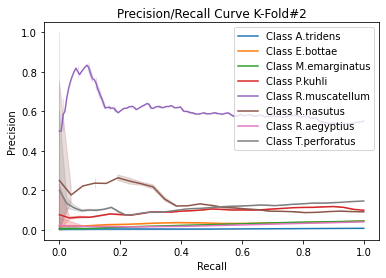

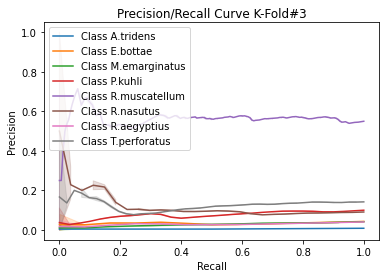

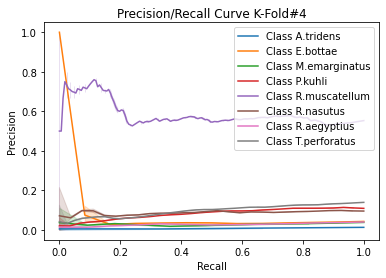

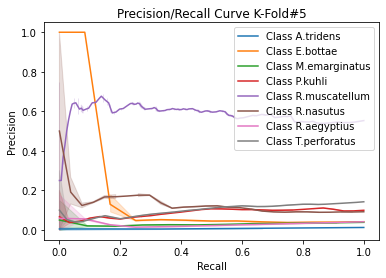

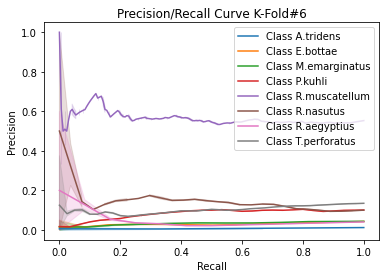

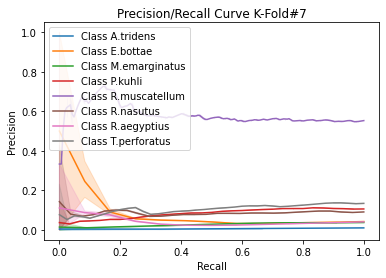

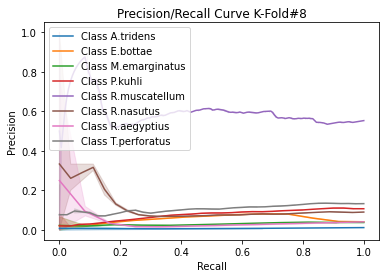

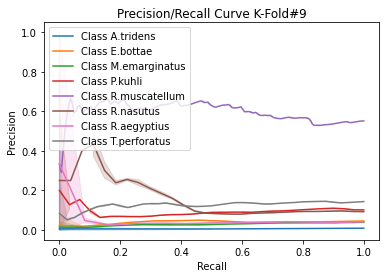

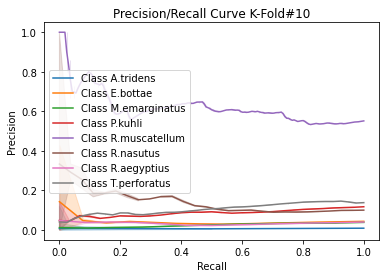

In [34]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  0   0   0   0   0   2   0   0]
 [  0   1   0   0   0  12   0   0]
 [  0   0   0   0   0  11   0   0]
 [  0   2   0   0   0  27   0   0]
 [  0   9   0   0   0 157   0   0]
 [  0   2   0   0   0  25   0   0]
 [  0   0   0   0   0  13   0   0]
 [  0   0   0   0   0  41   0   0]]


Confusion Matrix K-Fold #2

[[  0   0   0   0   0   2   0   0]
 [  0   0   0   0   0  13   0   0]
 [  0   0   0   0   0  12   0   0]
 [  0   1   0   0   0  29   0   0]
 [  0  14   0   0   0 152   0   0]
 [  0   0   0   0   0  26   0   0]
 [  0   0   0   0   0  12   0   0]
 [  0   1   0   0   0  40   0   0]]


Confusion Matrix K-Fold #3

[[  0   0   0   0   0   2   0   0]
 [  0   0   0   0   0  12   0   0]
 [  0   0   0   0   0  12   0   0]
 [  0   0   0   0   0  30   0   0]
 [  0   9   0   0   0 157   0   0]
 [  0   1   0   0   0  26   0   0]
 [  0   0   0   0   0  12   0   0]
 [  0   1   0   0   0  40   0   0]]


Confusion Matrix K-Fold #4

[[  0   0   0   0   0   3   0   0]
 [  

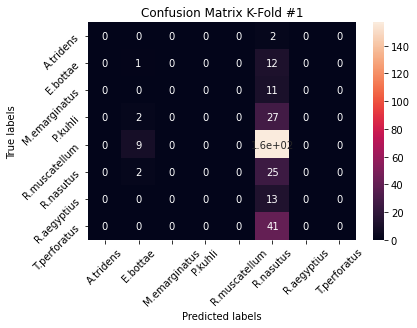

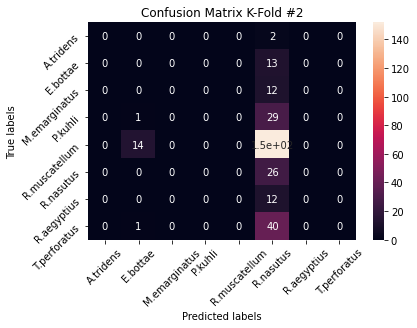

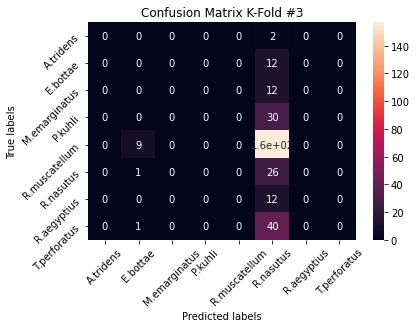

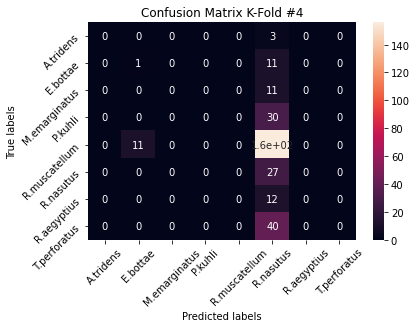

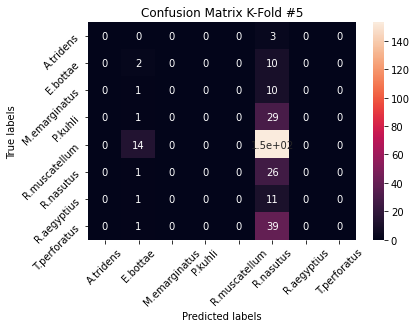

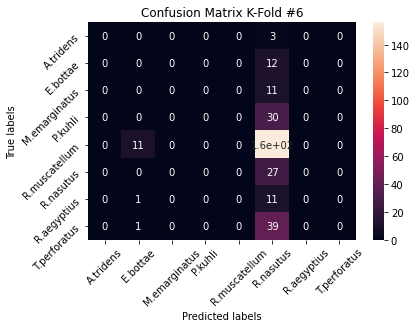

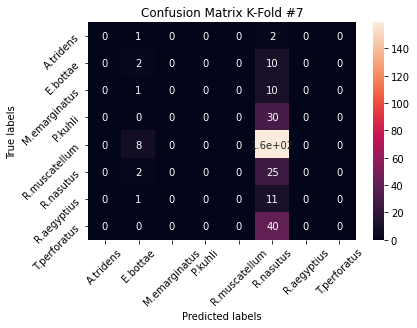

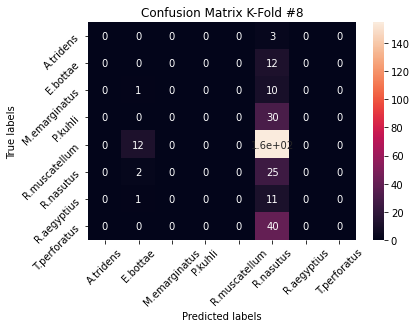

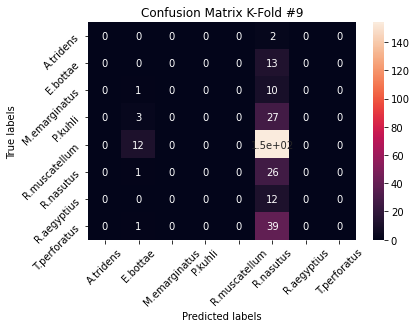

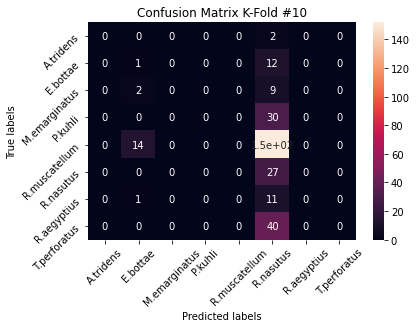

In [35]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[   0    1    0    0    0   24    0    0]
 [   0    7    0    0    0  117    0    0]
 [   0    6    0    0    0  106    0    0]
 [   0    7    0    0    0  292    0    0]
 [   0  114    0    0    0 1551    0    0]
 [   0    9    0    0    0  260    0    0]
 [   0    5    0    0    0  116    0    0]
 [   0    5    0    0    0  398    0    0]]

average of all confuion matrices
 [[  0   0   0   0   0   2   0   0]
 [  0   0   0   0   0  11   0   0]
 [  0   0   0   0   0  10   0   0]
 [  0   0   0   0   0  29   0   0]
 [  0  11   0   0   0 155   0   0]
 [  0   0   0   0   0  26   0   0]
 [  0   0   0   0   0  11   0   0]
 [  0   0   0   0   0  39   0   0]]


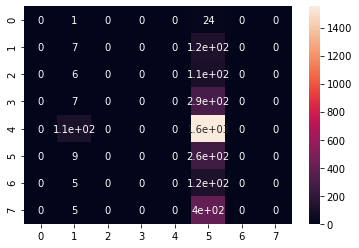

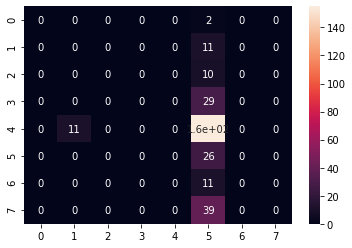

In [36]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.   0.04 0.   0.   0.   0.96 0.   0.  ]
 [0.   0.06 0.   0.   0.   0.94 0.   0.  ]
 [0.   0.05 0.   0.   0.   0.95 0.   0.  ]
 [0.   0.02 0.   0.   0.   0.98 0.   0.  ]
 [0.   0.07 0.   0.   0.   0.93 0.   0.  ]
 [0.   0.03 0.   0.   0.   0.97 0.   0.  ]
 [0.   0.04 0.   0.   0.   0.96 0.   0.  ]
 [0.   0.01 0.   0.   0.   0.99 0.   0.  ]]


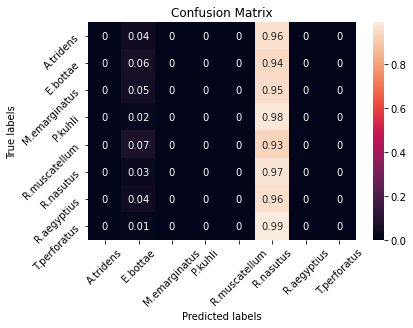

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

# V6 Load Data prior 8 jun

In [38]:
folder = "models"
mode_version = "spec_smote_v6"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v6


In [39]:
X_all = []
Y_all = []

image_folder_path = '../../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((85, 56))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [40]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 56, 85, 3)
(3018,)


In [41]:
def build_current_model():
    inp = Input(shape=(56,85,3))
    lay = Convolution2D(filters=168,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.2)(lay)

    lay = Convolution2D(filters=56,kernel_size=(7,7),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=232,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=104,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.4)(lay)

    lay = Flatten()(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model



In [42]:
model = build_current_model()
model.summary()

Model: "model_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 56, 85, 3)]       0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 28, 43, 168)       24864     
_________________________________________________________________
batch_normalization_143 (Bat (None, 28, 43, 168)       672       
_________________________________________________________________
activation_143 (Activation)  (None, 28, 43, 168)       0         
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 14, 22, 168)       0         
_________________________________________________________________
dropout_55 (Dropout)         (None, 14, 22, 168)       0         
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 7, 11, 56)         461

In [43]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 5s - loss: 1.4466 - accuracy: 0.4610 - val_loss: 1.9567 - val_accuracy: 0.4136
Epoch 2/100
1199/1199 - 5s - loss: 0.6342 - accuracy: 0.7719 - val_loss: 1.8287 - val_accuracy: 0.3364
Epoch 3/100
1199/1199 - 5s - loss: 0.4205 - accuracy: 0.8547 - val_loss: 0.6583 - val_accuracy: 0.7721
Epoch 4/100
1199/1199 - 6s - loss: 0.3377 - accuracy: 0.8823 - val_loss: 0.6596 - val_accuracy: 0.7868
Epoch 5/100
1199/1199 - 5s - loss: 0.2822 - accuracy: 0.9025 - val_loss: 0.4371 - val_accuracy: 0.8566
E

Epoch 38/100
1199/1199 - 5s - loss: 0.0546 - accuracy: 0.9806 - val_loss: 0.3177 - val_accuracy: 0.9118
Epoch 39/100
1199/1199 - 5s - loss: 0.0564 - accuracy: 0.9819 - val_loss: 0.2466 - val_accuracy: 0.9301
Epoch 40/100
1199/1199 - 5s - loss: 0.0590 - accuracy: 0.9813 - val_loss: 0.2780 - val_accuracy: 0.9210
Epoch 41/100
1199/1199 - 5s - loss: 0.0554 - accuracy: 0.9838 - val_loss: 0.1828 - val_accuracy: 0.9522
Epoch 42/100
1199/1199 - 5s - loss: 0.0463 - accuracy: 0.9840 - val_loss: 0.3406 - val_accuracy: 0.9136
Epoch 43/100
1199/1199 - 5s - loss: 0.0567 - accuracy: 0.9823 - val_loss: 0.2308 - val_accuracy: 0.9320
Epoch 44/100
1199/1199 - 5s - loss: 0.0538 - accuracy: 0.9818 - val_loss: 0.3232 - val_accuracy: 0.9173
Epoch 45/100
1199/1199 - 5s - loss: 0.0609 - accuracy: 0.9804 - val_loss: 0.3695 - val_accuracy: 0.8879
Epoch 46/100
1199/1199 - 5s - loss: 0.0414 - accuracy: 0.9878 - val_loss: 0.2937 - val_accuracy: 0.9173
Epoch 47/100
1199/1199 - 5s - loss: 0.0480 - accuracy: 0.9830 - 

Epoch 40/100
1199/1199 - 5s - loss: 0.0522 - accuracy: 0.9835 - val_loss: 0.2793 - val_accuracy: 0.9338
Epoch 41/100
1199/1199 - 5s - loss: 0.0478 - accuracy: 0.9850 - val_loss: 0.2303 - val_accuracy: 0.9375
Epoch 42/100
1199/1199 - 5s - loss: 0.0475 - accuracy: 0.9849 - val_loss: 0.4389 - val_accuracy: 0.9210
Epoch 43/100
1199/1199 - 5s - loss: 0.0498 - accuracy: 0.9837 - val_loss: 0.3059 - val_accuracy: 0.9357
Epoch 44/100
1199/1199 - 5s - loss: 0.0504 - accuracy: 0.9839 - val_loss: 0.3777 - val_accuracy: 0.8952
Epoch 45/100
1199/1199 - 5s - loss: 0.0476 - accuracy: 0.9844 - val_loss: 0.2870 - val_accuracy: 0.9265
Epoch 46/100
1199/1199 - 5s - loss: 0.0443 - accuracy: 0.9864 - val_loss: 0.4762 - val_accuracy: 0.8860
Epoch 47/100
1199/1199 - 5s - loss: 0.0405 - accuracy: 0.9859 - val_loss: 0.3259 - val_accuracy: 0.9136
Epoch 48/100
1199/1199 - 5s - loss: 0.0459 - accuracy: 0.9845 - val_loss: 0.3716 - val_accuracy: 0.9393
Epoch 49/100
Restoring model weights from the end of the best ep

Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 56, 85, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 5s - loss: 1.2894 - accuracy: 0.5345 - val_loss: 1.0430 - val_accuracy: 0.6673
Epoch 2/100
1198/1198 - 5s - loss: 0.5912 - accuracy: 0.7890 - val_loss: 0.5103 - val_accuracy: 0.8566
Epoch 3/100
1198/1198 - 5s - loss: 0.4200 - accuracy: 0.8529 - val_loss: 0.9806 - val_accuracy: 0.6029
Epoch 4/100
1198/1198 - 5s - loss: 0.3294 - accuracy: 0.8829 - val_loss: 0.5249 - val_accuracy: 0.7886
Epoch 5/100
1198/1198 - 5s - loss: 0.2827 - accuracy: 0.9001 - val_loss: 0.7547 - val_accuracy: 0.7610
Epoch 6/100
1198/1198 - 5s - loss: 0.2474 - accuracy: 0.9144 - val_loss: 0.5785 - val_accuracy: 0.7849
Epoch 7/100
1198/1198 - 5s - loss: 0.2178 - accuracy: 0.9260 - val_loss: 0.3687 - val_accurac

Epoch 35/100
1198/1198 - 5s - loss: 0.0575 - accuracy: 0.9812 - val_loss: 0.5838 - val_accuracy: 0.8180
Epoch 36/100
1198/1198 - 7s - loss: 0.0566 - accuracy: 0.9814 - val_loss: 0.4691 - val_accuracy: 0.8529
Epoch 37/100
1198/1198 - 5s - loss: 0.0549 - accuracy: 0.9824 - val_loss: 0.4865 - val_accuracy: 0.8493
Epoch 38/100
1198/1198 - 5s - loss: 0.0516 - accuracy: 0.9839 - val_loss: 0.2793 - val_accuracy: 0.9191
Epoch 39/100
1198/1198 - 5s - loss: 0.0572 - accuracy: 0.9826 - val_loss: 0.2523 - val_accuracy: 0.9412
Epoch 40/100
1198/1198 - 5s - loss: 0.0525 - accuracy: 0.9836 - val_loss: 0.3027 - val_accuracy: 0.9228
Epoch 41/100
1198/1198 - 5s - loss: 0.0567 - accuracy: 0.9830 - val_loss: 0.3254 - val_accuracy: 0.8879
Epoch 42/100
1198/1198 - 5s - loss: 0.0449 - accuracy: 0.9846 - val_loss: 0.2741 - val_accuracy: 0.9338
Epoch 43/100
1198/1198 - 6s - loss: 0.0497 - accuracy: 0.9848 - val_loss: 0.2736 - val_accuracy: 0.9357
Epoch 44/100
1198/1198 - 5s - loss: 0.0446 - accuracy: 0.9861 - 

Epoch 54/100
1198/1198 - 5s - loss: 0.0420 - accuracy: 0.9874 - val_loss: 0.5328 - val_accuracy: 0.8971
Epoch 55/100
1198/1198 - 6s - loss: 0.0431 - accuracy: 0.9884 - val_loss: 0.3711 - val_accuracy: 0.9301
Epoch 56/100
1198/1198 - 5s - loss: 0.0422 - accuracy: 0.9872 - val_loss: 0.3547 - val_accuracy: 0.9118
Epoch 57/100
1198/1198 - 5s - loss: 0.0330 - accuracy: 0.9896 - val_loss: 0.4625 - val_accuracy: 0.9320
Epoch 58/100
1198/1198 - 5s - loss: 0.0413 - accuracy: 0.9878 - val_loss: 0.4856 - val_accuracy: 0.9062
Epoch 59/100
1198/1198 - 5s - loss: 0.0258 - accuracy: 0.9922 - val_loss: 0.6635 - val_accuracy: 0.8842
Epoch 60/100
Restoring model weights from the end of the best epoch.
1198/1198 - 5s - loss: 0.0458 - accuracy: 0.9874 - val_loss: 0.3582 - val_accuracy: 0.9283
Epoch 00060: early stopping
models/spec_smote_v6_iter_7.model
INFO:tensorflow:Assets written to: models/spec_smote_v6_iter_7.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('

Epoch 18/100
1199/1199 - 5s - loss: 0.1088 - accuracy: 0.9648 - val_loss: 0.3965 - val_accuracy: 0.8713
Epoch 19/100
1199/1199 - 5s - loss: 0.0819 - accuracy: 0.9729 - val_loss: 0.2580 - val_accuracy: 0.9173
Epoch 20/100
1199/1199 - 5s - loss: 0.0900 - accuracy: 0.9721 - val_loss: 0.3255 - val_accuracy: 0.9118
Epoch 21/100
1199/1199 - 6s - loss: 0.0778 - accuracy: 0.9745 - val_loss: 0.3875 - val_accuracy: 0.9118
Epoch 22/100
1199/1199 - 5s - loss: 0.0973 - accuracy: 0.9679 - val_loss: 0.3960 - val_accuracy: 0.8824
Epoch 23/100
1199/1199 - 5s - loss: 0.0778 - accuracy: 0.9721 - val_loss: 0.3842 - val_accuracy: 0.9173
Epoch 24/100
1199/1199 - 6s - loss: 0.0839 - accuracy: 0.9728 - val_loss: 0.2665 - val_accuracy: 0.9338
Epoch 25/100
1199/1199 - 5s - loss: 0.0712 - accuracy: 0.9761 - val_loss: 0.5152 - val_accuracy: 0.8842
Epoch 26/100
1199/1199 - 5s - loss: 0.0699 - accuracy: 0.9756 - val_loss: 0.6479 - val_accuracy: 0.8309
Epoch 27/100
1199/1199 - 5s - loss: 0.0740 - accuracy: 0.9750 - 

Epoch 20/100
1199/1199 - 6s - loss: 0.0887 - accuracy: 0.9714 - val_loss: 0.3220 - val_accuracy: 0.8934
Epoch 21/100
1199/1199 - 5s - loss: 0.0688 - accuracy: 0.9764 - val_loss: 0.5011 - val_accuracy: 0.8438
Epoch 22/100
1199/1199 - 5s - loss: 0.0878 - accuracy: 0.9717 - val_loss: 0.3824 - val_accuracy: 0.8897
Epoch 23/100
1199/1199 - 5s - loss: 0.0693 - accuracy: 0.9764 - val_loss: 0.3516 - val_accuracy: 0.9154
Epoch 24/100
1199/1199 - 5s - loss: 0.0720 - accuracy: 0.9772 - val_loss: 0.4013 - val_accuracy: 0.9081
Epoch 25/100
1199/1199 - 5s - loss: 0.0613 - accuracy: 0.9804 - val_loss: 0.3047 - val_accuracy: 0.9099
Epoch 26/100
1199/1199 - 5s - loss: 0.0695 - accuracy: 0.9772 - val_loss: 0.3168 - val_accuracy: 0.9173
Epoch 27/100
1199/1199 - 5s - loss: 0.0695 - accuracy: 0.9766 - val_loss: 0.4346 - val_accuracy: 0.8842
Epoch 28/100
1199/1199 - 5s - loss: 0.0706 - accuracy: 0.9775 - val_loss: 0.3701 - val_accuracy: 0.9062
Epoch 29/100
1199/1199 - 5s - loss: 0.0590 - accuracy: 0.9801 - 

# LOAD AND EVAL

In [44]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [45]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 87), ('T.perforatus', 290), ('P.kuhli', 215), ('A.tridens', 18), ('M.emarginatus', 80)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 289), ('R.muscatellum', 1199), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('M.emarginatus', 80), ('R.nasutus', 194), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('E.bottae', 1199), ('R.aegyptius', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.nasutus', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 56, 85, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 56, 85, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 56, 85, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 56, 85, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 56, 85, 3)
Y_train: shape=  (9584, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)


/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/team9/anaconda3/envs/gpu/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


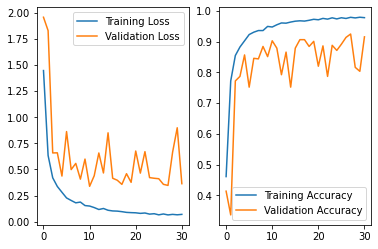

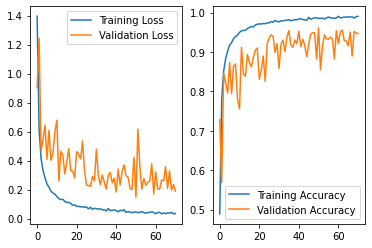

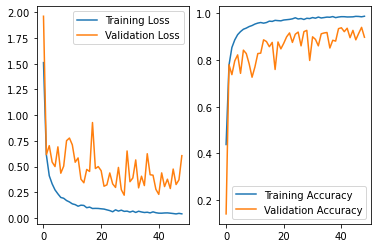

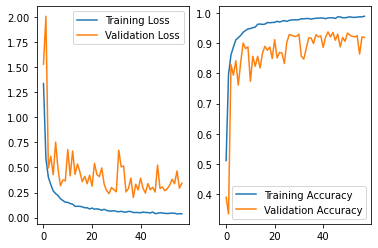

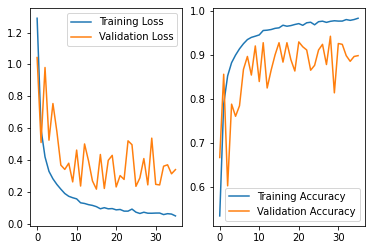

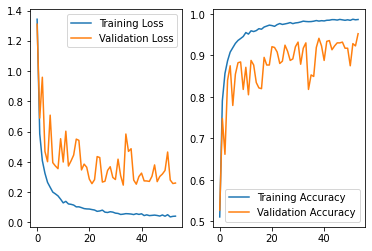

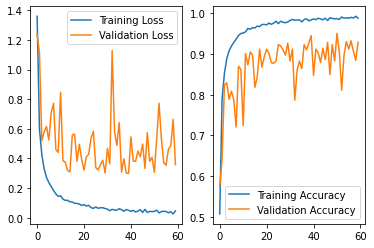

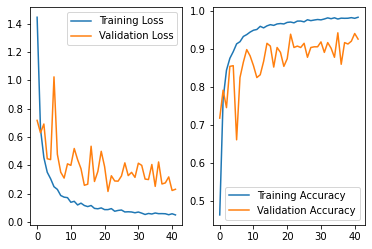

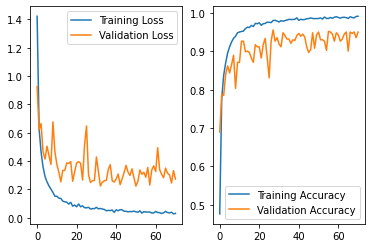

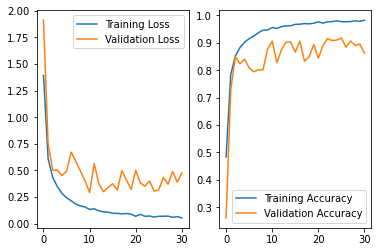

In [46]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [47]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.         0.         0.         0.         0.         0.
 0.         0.13353172]
precision sdev by class [0.         0.         0.         0.         0.         0.
 0.         0.00146924]
macro precision mean 0.01669146443422587
macro precision sdev 0.0001836548796464538
recall mean [0. 0. 0. 0. 0. 0. 0. 1.]
recall sdev [0. 0. 0. 0. 0. 0. 0. 0.]
macro recall mean 0.125
macro recall sdev 0.0
f1 mean [0.     0.     0.     0.     0.     0.     0.     0.2356]
f1 sdev [0.         0.         0.         0.         0.         0.
 0.         0.00228448]
macro f1 mean 0.029450000257491338
macro f1 sdev 0.0002855599948914572
accuracy mean 0.13353171547380696
accuracy sdev 0.0014692390371716304


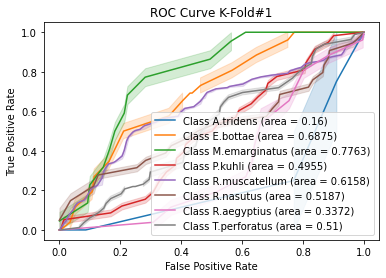

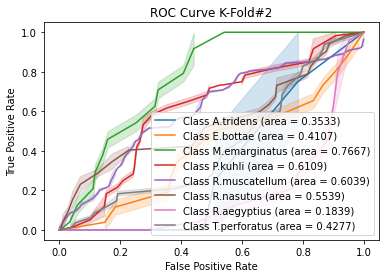

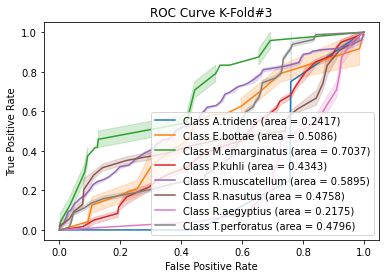

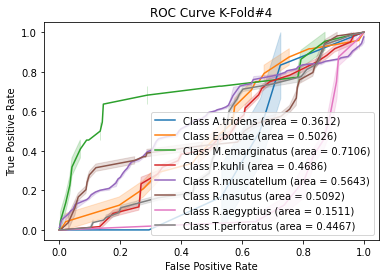

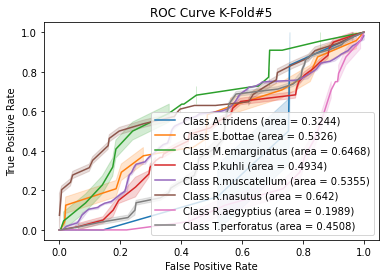

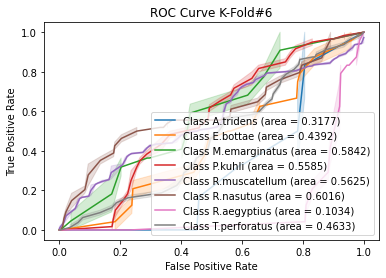

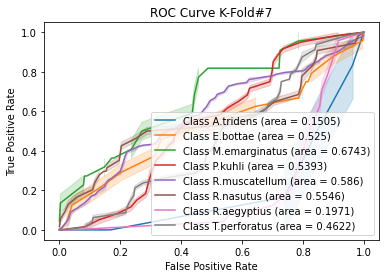

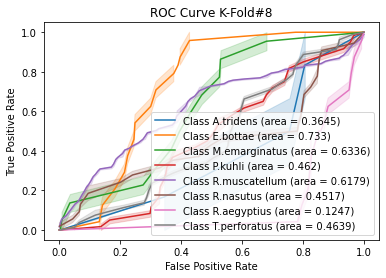

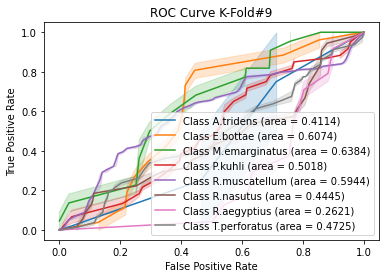

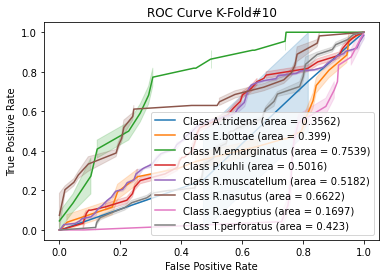

In [48]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [49]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.3040953177257525
Std  0.08509555820110563
Sp:  E.bottae
AUC Mean  0.5345718872663748
Std  0.10615113122939732
Sp:  M.emarginatus
AUC Mean  0.6888495243943165
Std  0.06096409262125562
Sp:  P.kuhli
AUC Mean  0.5065994326440434
Std  0.04862245691769763
Sp:  R.muscatellum
AUC Mean  0.5787873715125855
Std  0.03156322500765517
Sp:  R.nasutus
AUC Mean  0.5414250491389495
Std  0.07208876043358974
Sp:  R.aegyptius
AUC Mean  0.1945766370208561
Std  0.06424069565305061
Sp:  T.perforatus
AUC Mean  0.45996743188016237
Std  0.023987849961859698


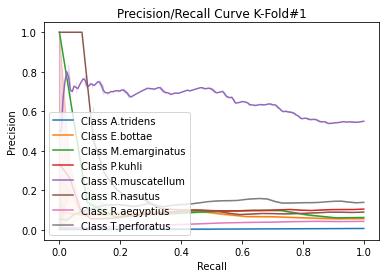

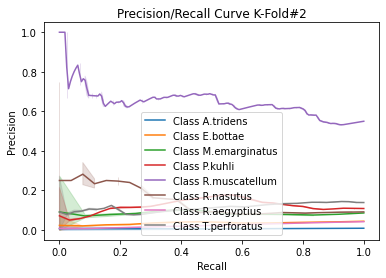

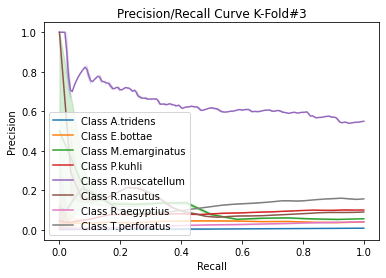

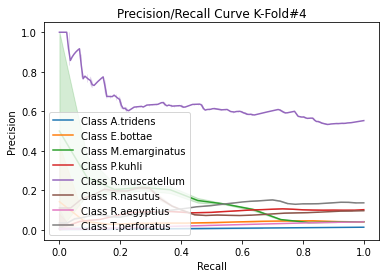

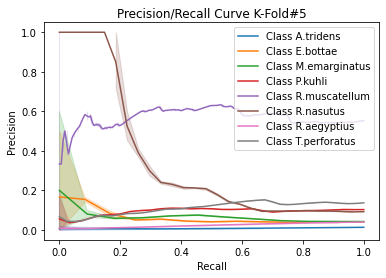

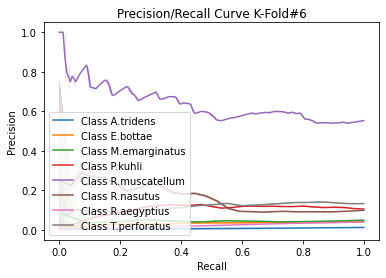

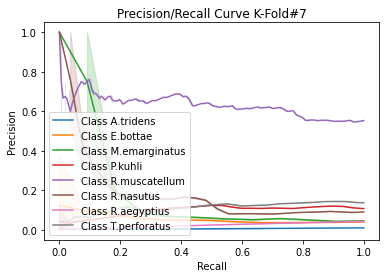

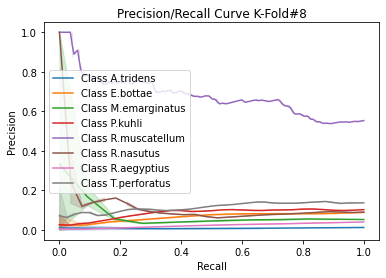

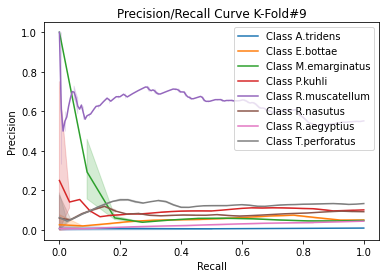

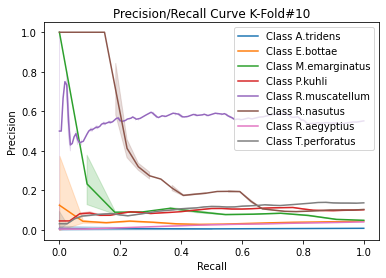

In [50]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  0   0   0   0   0   0   0   2]
 [  0   0   0   0   0   0   0  13]
 [  0   0   0   0   0   0   0  11]
 [  0   0   0   0   0   0   0  29]
 [  0   0   0   0   0   0   0 166]
 [  0   0   0   0   0   0   0  27]
 [  0   0   0   0   0   0   0  13]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #2

[[  0   0   0   0   0   0   0   2]
 [  0   0   0   0   0   0   0  13]
 [  0   0   0   0   0   0   0  12]
 [  0   0   0   0   0   0   0  30]
 [  0   0   0   0   0   0   0 166]
 [  0   0   0   0   0   0   0  26]
 [  0   0   0   0   0   0   0  12]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  0   0   0   0   0   0   0   2]
 [  0   0   0   0   0   0   0  12]
 [  0   0   0   0   0   0   0  12]
 [  0   0   0   0   0   0   0  30]
 [  0   0   0   0   0   0   0 166]
 [  0   0   0   0   0   0   0  27]
 [  0   0   0   0   0   0   0  12]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #4

[[  0   0   0   0   0   0   0   3]
 [  

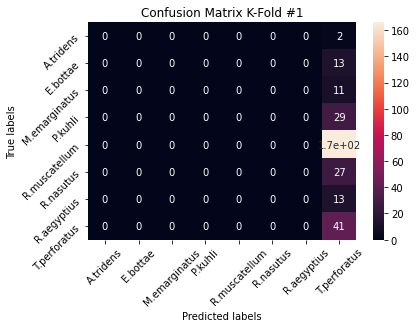

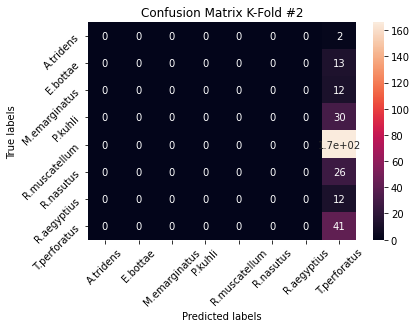

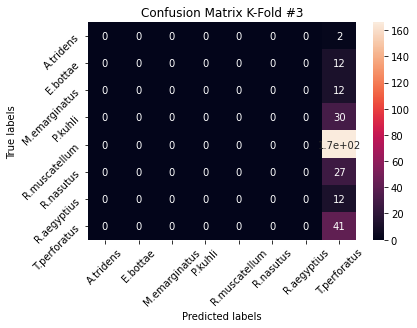

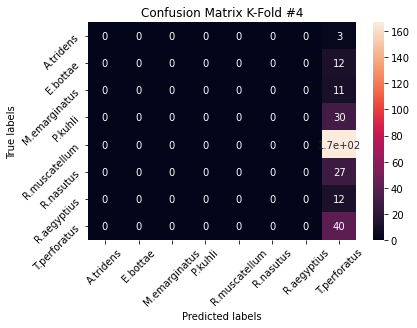

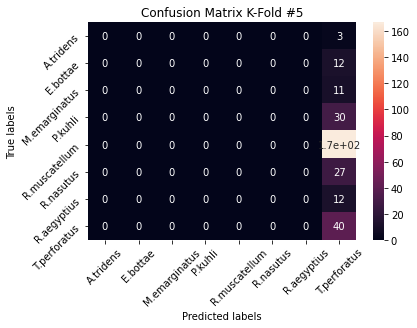

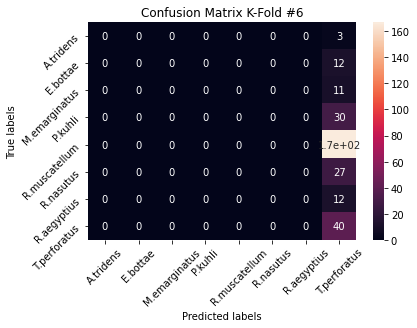

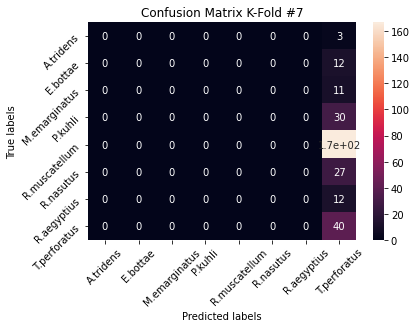

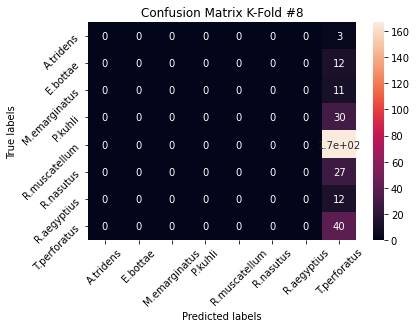

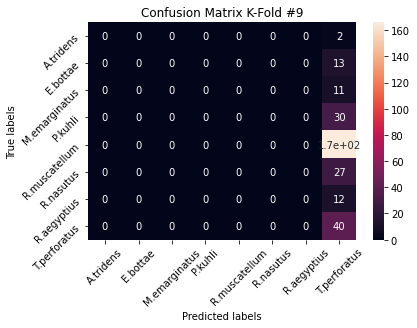

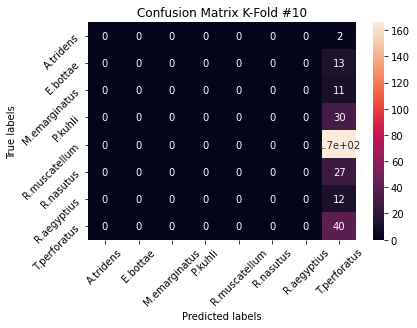

In [51]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[   0    0    0    0    0    0    0   25]
 [   0    0    0    0    0    0    0  124]
 [   0    0    0    0    0    0    0  112]
 [   0    0    0    0    0    0    0  299]
 [   0    0    0    0    0    0    0 1665]
 [   0    0    0    0    0    0    0  269]
 [   0    0    0    0    0    0    0  121]
 [   0    0    0    0    0    0    0  403]]

average of all confuion matrices
 [[  0   0   0   0   0   0   0   2]
 [  0   0   0   0   0   0   0  12]
 [  0   0   0   0   0   0   0  11]
 [  0   0   0   0   0   0   0  29]
 [  0   0   0   0   0   0   0 166]
 [  0   0   0   0   0   0   0  26]
 [  0   0   0   0   0   0   0  12]
 [  0   0   0   0   0   0   0  40]]


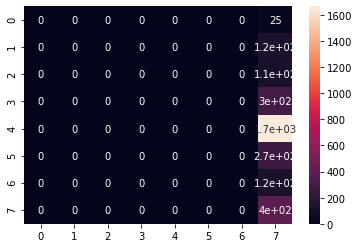

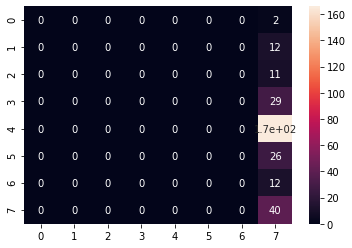

In [52]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1.]]


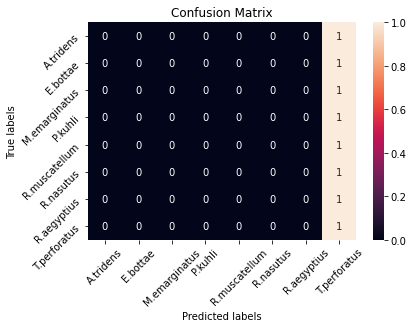

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);